In [1]:
import sys 
#sys.path.append('C:\\Users\\Eesh Gupta\\Documents\\RU Research\\Chakram')
#sys.path.append('C:\\Users\\Eesh Gupta\\Documents\\RU Research\\Chakram\\ECD_control')


In [2]:
%load_ext autoreload
%autoreload 2

In [3]:
#sys.path.append('cache/home/eag190/quantum_optimal_control')

In [4]:
sys.path

['/home/eag190/Multimode-Conditional-Displacements/hpc_runs/multimode_circle_grape/sample workflow',
 '/home/eag190/miniconda3/envs/simulations/lib/python39.zip',
 '/home/eag190/miniconda3/envs/simulations/lib/python3.9',
 '/home/eag190/miniconda3/envs/simulations/lib/python3.9/lib-dynload',
 '',
 '/home/eag190/miniconda3/envs/simulations/lib/python3.9/site-packages',
 '/cache/home/eag190/ECD_control',
 '/home/eag190/miniconda3/envs/simulations/lib/python3.9/site-packages/quantum_optimal_control-0.1.0-py3.9.egg']

In [5]:
#import quantum_optimal_control

In [6]:
%matplotlib inline
import os
import sys
import inspect
import numpy as np
from scipy.special import factorial
import h5py
from quantum_optimal_control.helper_functions.grape_functions import *
from quantum_optimal_control.main_grape.grape import Grape

#data_path = 'C:/Users\Eesh Gupta\Documents\RU Research\Chakram'
data_path ='./data'
initial_pulse = '../pulses/example_pulses/transmon_cat_initial_pulse.h5'
from h5py import File
import matplotlib.pyplot as plt
from pylab import*
from qutip import*

from scipy import interpolate
font = {'family' : 'normal',
        'weight' : 'normal',
        'size'   : 18}

matplotlib.rc('font', **font)


$$\newcommand{\ket}[1]{\left|{#1}\right\rangle}
\newcommand{\bra}[1]{\left\langle{#1}\right|}$$


# Circle GRAPE

Here we consider a new protocol developed by the Devoret group that uses a large detuned cavity drive to bias the system and perform gate operations using the resulting controlled displacement and optimal control pulses acting only on the transmon. These gates are potentially faster than that of SNAP gates with fidelities limited by $\gamma/(\alpha\chi)$ instead of $\gamma/\chi$.

The Hamiltonian of a single cavity mode ($i$) in the presense of a large detuned cavity drive that leads to a displacement $\alpha$, after performing a displacement transformation is:
\begin{eqnarray}
\tilde{\hat{H}} &=&  -\frac{\Delta_q}{2}\sigma_z + \left(\tilde{\Omega}(t)\sigma_{-}+\mathrm{c.c.}\right)  -\Delta_{i}\left(\hat{a}_{i}^{\dagger}\hat{a}_{i}\right) + \frac{\chi_{i}}{2}\left(\hat{a}_{i}^{\dagger}\hat{a}_{i}\right)\sigma_z + \frac{\chi_{i}}{2}\left(\alpha\hat{a}_{i}^{\dagger}+\alpha^{*
}\hat{a}_{i}\right)\sigma_z + \frac{\chi_{i}}{2}|\alpha|^2 
\end{eqnarray}
We chose the carrier frequency for the transmon drive to be such that $\Delta_q = \chi_i|\alpha|^2$. The size of the displacement is limited by nonlinear terms arising from  self and cross-Kerr interactions:
$$  \tilde{\hat{H}}_{nl} = \sum_{i}\frac{\kappa_i}{2}\hat{a}_i^{\dagger}\hat{a}_i\left(\hat{a}_i^{\dagger}\hat{a}_i-1\right)+
\sum_{ij}\frac{\kappa_{ij}}{2}\left(\hat{a}_i^{\dagger}\hat{a}_i\right)\left(\hat{a}_j^{\dagger}\hat{a}_j\right).$$
We ignore the other modes and the cross-Kerr terms. The self-Kerr term for the target mode is transformed in the displaced frame to:
$$ \tilde{\hat{H}}_{Kerr} \rightarrow \frac{\kappa_i}{2}\left[\hat{a}^{\dagger}\hat{a}\left(\hat{a}^{\dagger}\hat{a}-1\right) + 2|\alpha|^2(\alpha^*\hat{a}+\alpha\hat{a}^{\dagger}) + 2(\alpha^*\hat{a}^{\dagger}\hat{a}^2+\alpha{\hat{a}^\dagger}^{2}\hat{a}) + 2(\alpha^2{\hat{a}^{\dagger}}^2+{\alpha^*}^2\hat{a}^{2})+4|\alpha|^2{\hat{a}}^{\dagger}\hat{a}\right] $$





# 3DMM2 parameters

In [7]:
# chi = Peak splitting MHz
chis = 2*array([-1.1962, -0.8676, -0.668 , -0.5679, -0.4677, -0.3718, -0.3588,-0.3127, -0.2714, -0.2758]) 

kappas  = array([18,9.02,5.23,4.19,3.24,1.4,1.48,0.72]) # kHz
T1s = array([2.0222, 2.1362, 2.0495, 1.8843, 1.7903, 1.8429, 2.0087, 1.9382,1.9977])*1e3

cKerrs = array([[-4.43, -16.26, 0.0, -8.03, -6.29, -5.21, -3.01, -2.05, 0.0, 0.0],
 [-16.8, 0.0, -7.92, -5.5, -3.63, -2.39, 0.0, -1.1, -0.8, 0.0],
 [-13.01, 0.0, -0.62, 0.0, -1.83, 0.0, -0.77, -0.67, 0.0, 0.0],
 [-10.78, -6.5, -3.33, 0.0, -1.24, 0.0, 0.0, -1.03, -0.47, 0.0],
 [-7.39, 0.0, 0.0, -0.99, 0.37, -0.16, 0.0, 0.92, 0.23, 0.0],
 [0.0, -3.44, -3.4, -3.05, -0.78, 0.49, 0.44, 0.64, 0.1, 0.0],
 [-6.63, -2.63, -1.96, -1.05, 0.0, -0.63, 0.0, 0.64, 0.27, 0.0],
 [-5.08, -1.51, -1.37, -0.86, -0.12, 0.83, 0.07, 0.98, 0.91, 0.0],
 [-4.7, -1.82, -2.08, -0.83, -0.15, 0.0, 0.0, -0.41, 0.0, 0.0],
 [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]]) 

# Multimode circle grape

In [8]:
transmon_levels = 2
np.diag(np.sqrt(np.arange(1, transmon_levels)), 1)+np.diag(np.sqrt(np.arange(1, transmon_levels)), -1)
np.diag(np.arange(0, transmon_levels))
np.diag([1,-1])

array([[ 1,  0],
       [ 0, -1]])

In [9]:
# The time dependence of the blockade drive is rotated out.
from itertools import product

class multimode_circle_grape_optimal_control:
    
    def __init__(self,mode_state_num,number_of_modes,hparams,t1params = None,add_disp_kerr=False, ROTATING=True,SAMPLE_RATE = 1):       
        self.mnum = mode_state_num
        self.mmnum = number_of_modes
        self.ROTATING = ROTATING
        self.hparams = hparams
        self.t1params = t1params
        self.SAMPLE_RATE = SAMPLE_RATE
        transmon_levels = 2
        self.qnum = 2
        mode_levels = self.mnum
        self.add_disp_kerr =add_disp_kerr
        

        self.Q_x = np.diag(np.sqrt(np.arange(1, transmon_levels)), 1)+np.diag(np.sqrt(np.arange(1, transmon_levels)), -1)
        self.Q_y = (0+1j) * (np.diag(np.sqrt(np.arange(1, transmon_levels)), 1)-np.diag(np.sqrt(np.arange(1, transmon_levels)), -1))
        self.Q_z = np.diag([1,-1])
        self.I_q = np.identity(transmon_levels)
        
        # Mode Pauli Operatirs
        self.M_x = np.diag(np.sqrt(np.arange(1, mode_levels)), 1)+np.diag(np.sqrt(np.arange(1, mode_levels)), -1)
        self.M_y = (0+1j) * (np.diag(np.sqrt(np.arange(1, mode_levels)), 1)-np.diag(np.sqrt(np.arange(1, mode_levels)), -1))
        self.M_z = np.diag(np.arange(0, mode_levels))
        self.I_m = np.identity(mode_levels)
        self.am =  np.diag(np.sqrt(np.arange(1, mode_levels)), 1)
        self.amdag =  np.diag(np.sqrt(np.arange(1, mode_levels)), -1)
        self.aq =  np.diag(np.sqrt(np.arange(1, self.qnum)), 1)

        self.M_zs,self.M_xs,self.M_ys,self.ams=  [],[],[],[]
        self.a_s,self.adag_s = [],[]
        
        for k in np.arange(self.mmnum):
            mmz = self.M_z*(k==0) + self.I_m*(1-(k==0))
            mmx = self.M_x*(k==0) + self.I_m*(1-(k==0))
            mmy = self.M_y*(k==0) + self.I_m*(1-(k==0))
            mma = self.am*(k==0) + self.I_m*(1-(k==0))
            mmadag = self.amdag*(k==0) + self.I_m*(1-(k==0))
            for m in arange(1,self.mmnum):
                mmz = kron(mmz,self.M_z*(k==m) + self.I_m*(1-(k==m)))
                mmx = kron(mmx,self.M_x*(k==m) + self.I_m*(1-(k==m)))
                mmy = kron(mmy,self.M_y*(k==m) + self.I_m*(1-(k==m)))
                mma = kron(mma,self.am*(k==m) + self.I_m*(1-(k==m)))
                mmadag = kron(mmadag,self.amdag*(k==m) + self.I_m*(1-(k==m)))
            self.M_zs.append(mmz)
            self.M_xs.append(mmx)
            self.M_ys.append(mmy)
            self.a_s.append(mma)
            self.adag_s.append(mmadag)
            self.ams.append(Qobj(kron(self.I_q, mma)))
        self.I_mm = self.I_m
        for m in arange(1,self.mmnum):self.I_mm = kron(self.I_mm,self.I_m)
        self.aqmm = Qobj(kron(self.aq,self.I_mm))

    def openfile(self,filename):
        return File(filename,'r')
    
    def H_rot(self):
        chis,kappas,alpha,delta_c = self.hparams["chis"],self.hparams["kappas"],self.hparams["alpha"],self.hparams["delta_c"]
        freq_ge,mode_ens,mode_freq = 0,0,delta_c # GHz, in lab frame
     

        H0 = 0
        for ii,chi in enumerate(chis):
            chi_mat = chi/2.0*self.Q_z
            mode_ens = np.array([2*np.pi*mm*(mode_freq - 0.5*(mm-1)*kappas[ii]) for mm in np.arange(self.mnum)]) 
            H_m = np.diag(mode_ens)
            ret = H_m*(ii==0) + self.I_m*(1-(ii==0))
            for m in arange(1,self.mmnum):
                ret = kron(ret,H_m*(ii==m) + self.I_m*(1-(ii==m)))
            H0 += np.kron(self.I_q, ret)           
            H0 += 2* np.pi/2.0*(np.kron(chi_mat, (self.M_zs[ii])))
            H0 += 2* np.pi/2.0*alpha*(np.kron(chi_mat, (self.M_xs[ii])))
        
        if not self.add_disp_kerr:pass
        else:
            Hnl = 0
            for ii,chi in enumerate(chis):
                Hnl+= 2*np.pi/2.0*kappas[ii]*2*alpha**3*(np.kron(self.I_q, self.M_xs[ii]))
                Hnl+= 2*np.pi/2.0*kappas[ii]*2*alpha**2*(np.kron(self.I_q, self.a_s[ii] @ self.a_s[ii] \
                                                                 +self.adag_s[ii] @ self.adag_s[ii]))         
                Hnl+= 2*np.pi/2.0*kappas[ii]*2*alpha*(np.kron(self.I_q, self.adag_s[ii] @ self.adag_s[ii] @ self.a_s[ii] \
                                       + self.adag_s[ii] @ self.a_s[ii] @ self.a_s[ii]))
                Hnl+= 2*np.pi/2.0*kappas[ii]*4*alpha**2*(np.kron(self.I_q, self.M_zs[ii])) 
            H0 += Hnl
           
        return (H0)

    def controlHs(self):
    
        controlHs = []  
        
       # for each mode in cavity
        for m in np.arange(self.mmnum):
        
            XI = np.kron(self.Q_x, self.I_mm)
            YI = np.kron(self.Q_y, self.I_mm)
            controlHs.append(XI)
            controlHs.append(YI)

        return controlHs
    
    def return_pulses(self,filename):

        fine_pulses = []
        num_ops = len(self.controlHs())
        self.f = self.openfile(filename)
        self.total_time = self.f['total_time'][()]
        self.steps = self.f['steps'][()]
        self.dt = float(self.total_time) /self.steps
        self.fine_steps = self.total_time * self.SAMPLE_RATE
        self.base_times = np.arange(self.steps + 1) * self.total_time / self.steps
        self.tlist = np.arange(self.fine_steps + 1) * self.total_time / self.fine_steps
        for i in range(num_ops):

            base_pulse = self.f['uks'][-1][i]  # final control pulse

            base_pulse = np.append(base_pulse, 0.0)  # add extra 0 on end of pulses for interpolation
            interpFun = interpolate.interp1d(self.base_times, base_pulse)
            pulse_interp = interpFun(self.tlist)
            fine_pulses.append(pulse_interp)

        return fine_pulses

    def plot_pulses(self,filename,plot_cavity=False):
        pulses = self.return_pulses(filename)
        fig, ax = plt.subplots(nrows=1, figsize=(14,4))
        if plot_cavity:end=4
        else:end = 2
        labels = ["Qubit_x","Qubit_y","Cavity_x","Cavity_y"] 
        for ii,x in enumerate(pulses[:end]):
            ax.plot(self.tlist/1e3,x,label = labels[ii] )
        ax.set_xlabel("Time ($\\mu$s)")
        ax.legend()
        ax.set_ylabel("Pulse amplitude (GHz)")
    
    def total_H(self,filename):
        if self.ROTATING:

            H = [Qobj(self.H_rot())]
            controlHs = self.controlHs()
            fine_pulses = self.return_pulses(filename)

            for index in range(len(fine_pulses)):
                H.append([Qobj(controlHs[index]), fine_pulses[index]]) 
                
        else: H = 0
        
        return (H)

    def run_optimal_control(self,state_transfer = True, initial_states = [0], target_states = [2], 
                            total_time = 25000.0, steps = 800,max_amp = 15e-6, 
                            taylor_terms = None,is_dressed=True, 
                            convergence = {}, reg_coeffs = {},
                            plot_only_g = True,
                            states_forbidden_list = [],initial_guess = None, 
                            file_name = "test",data_path="test",specify_state_amplitudes = False):
   
        Hops = self.controlHs()
        H0 = self.H_rot()
        ops_max_amp = []
        Hnames = []
        for ii in np.arange(self.mmnum):
            ops_max_amp.extend([max_amp*2*np.pi, max_amp*2*np.pi])
            Hnames.extend(['cavity'+str(ii)+'_x', 'cavity'+str(ii)+'_y'])
        print([len(Hops), len(ops_max_amp), len(Hnames)])
        U = []
        psi0 = []
        blank = np.zeros(self.qnum*self.mnum**self.mmnum)
        
        if is_dressed:
            dressed_info = None
            print("Computing dressed states.")
            dressed_val, dressed_vec, dressed_id = get_dressed_info(self.H_rot())
            print("Eigenvectors:",dressed_vec)
            print("Eigenvalues:",dressed_val)
            print("Map to bare states:",dressed_id)

            dressed_info = {}
            dressed_info['eigenvectors'] = dressed_vec
            dressed_info['dressed_id'] = dressed_id
            dressed_info['eigenvalues'] = dressed_val
            dressed_info['is_dressed'] = True
            
            if specify_state_amplitudes:
                for ii,initial_amps in enumerate(initial_states):
                    initial_amps = array(initial_amps)
                    final_amps = array(target_states[ii])
                    g = np.zeros_like(blank)
                    target = np.zeros_like(blank)
                    for i_a,a in enumerate(initial_amps):
                        g+= a*dressed_vec[dressed_id[i_a]]
                        target += final_amps[i_a]*dressed_vec[dressed_id[i_a]] 
                    psi0.append(g)
                    U.append(target)
                
            else:
                for ii,state in enumerate(initial_states):
                    g = dressed_vec[dressed_id[state]]
                    target = dressed_vec[dressed_id[target_states[ii]]] 
                    psi0.append(g)
                    U.append(target)
            
        else:
            dressed_info = None
            if specify_state_amplitudes:
                for ii,initial_amps in enumerate(initial_states):
                    initial_amps = array(initial_amps)
                    final_amps = array(target_states[ii])
                    g = np.zeros_like(blank)
                    target = np.zeros_like(blank)
                    for i_a,a in enumerate(initial_amps):
                        g[i_a]= a
                        target[i_a] = final_amps[i_a]
                    psi0.append(g)
                    U.append(target)
            else:
                for ii,state in enumerate(initial_states):
                    g = np.zeros_like(blank)
                    target = np.zeros_like(blank)
                    g[state] = 1
                    target[target_states[ii]] = 1
                    psi0.append(g)
                    U.append(target)
    

        #Defining Concerned states (starting states)
        print("starting states:")
        print(psi0)
        print("target states:")
        print(U)

        # #Defining states to include in the drawing of occupation
        if plot_only_g:
            states_draw_list = np.arange(self.mnum**self.mmnum) 
            state_indices  = [arg for arg in product(arange(self.mnum),repeat = self.mmnum)]
  
            states_draw_names = []
            for ii in range(len(states_draw_list)):
                s = ''
                for a in state_indices[ii]:s+=str(a)
                states_draw_names.append('g_' + s)


        states_forbidden_list = states_forbidden_list
        print(states_forbidden_list)

        ss = Grape(H0, Hops, Hnames, U, total_time, steps, psi0, convergence=convergence,
                             draw=[states_draw_list, states_draw_names], state_transfer=state_transfer, use_gpu=False,
                             sparse_H=False, show_plots=True, Taylor_terms=taylor_terms, method='Adam', initial_guess=initial_guess,
                             maxA=ops_max_amp, reg_coeffs=reg_coeffs, dressed_info=dressed_info, 
                             file_name=file_name, data_path=data_path, save = False)

    def plot_optimal_control(self,scales = [4367,4367,81.1684054679128, 81.1684054679128],pad_FFT = 3,filename = None,lim_scale=1.0):
        
        a = self.openfile(filename)


        update_step = a['convergence']['update_step'][()]
        steps = a['steps'][()]
        print ("steps = ",steps)
        dt = a['total_time'][()] / steps

        fig = plt.figure(figsize=(14,4*6))
        ax = fig.add_subplot(611,title = 'Control fields in GHz')
        circle_grape_labels = ['qubit_x','qubit_y']
        
        for i in range(len(a['Hops'][()])):
            ax.plot(np.arange(0, steps) * dt/1e3, a['uks'][-1][i])
        plt.legend(labels=[circle_grape_labels[ii] for ii in range(len(a['Hnames']))], prop={'size': 12})
        ax.plot(np.arange(0, steps) * dt/1e3, np.zeros(steps), '--k')  # plot a line y=0 for reference
        ax.set_xlabel("Time ($\mu$s)")
        ax.set_ylabel("$\\xi$ ($2\pi$ x GHz)")
        

        ax = fig.add_subplot(612,title = 'Control fields in AWG amplitudes')
    
        # plot control pulses, last element is the final control pulse output
        for i in range(len(a['Hops'][()])):
            ax.plot(np.arange(0, steps) * dt/1e3, a['uks'][-1][i] * scales[i])

        ax.plot(np.arange(0, steps) * dt/1e3, sqrt(a['uks'][-1][0]**2 + a['uks'][-1][1]**2) * scales[0],'k-')
        plt.legend(labels=[a['Hnames'][ii] for ii in range(len(a['Hnames']))], prop={'size': 12})
        ax.plot(np.arange(0, steps) * dt/1e3, np.zeros(steps), '--k')  # plot a line y=0 for reference
        
        ax.set_xlabel("Time ($\mu$s)")
        ax.set_ylabel("Amplitude")

        # plot Fourier transform of control pulses
        ax2 = fig.add_subplot(613)
        for i in range(len(a['Hops'][()])):
            ax2.plot(fftfreq((2*pad_FFT+1)*steps, d=dt), np.abs(fft(pad(a['uks'][-1][i],(pad_FFT*steps,pad_FFT*steps),'constant'))),'.-', label=a['Hnames'][i])
        
        plt.legend(labels=[a['Hnames'][ii] for ii in range(len(a['Hnames']))], prop={'size': 12})
        ax2.set_xlabel("Freq (GHz)")
        ax2.set_ylabel("FFT")
        limits = abs(self.hparams["chi"]*2*lim_scale)
        ax2.axvline(abs(self.hparams['omega']),color='r',linestyle='dashed')
        for ii in range(5):
            ax2.axvline(abs(2*self.hparams['chi'])*ii,color='b',linestyle='dashed')
        ax2.set_xlim(0,limits)


        ax3 = fig.add_subplot(614)
        ax3.semilogy(np.arange(0, len(a['error'])) * 5, a['error'])
        ax3.set_xlabel("Iteration")
        ax3.set_ylabel("Error")
        
        print("Minimum error", a['error'][-1])
        print("Number of taylor terms",a['taylor_terms'][()])
        
        ax4 = fig.add_subplot(615,title = "Cavity level populations")
        for i in range(len(a['inter_vecs_mag_squared'][0][0])):
            # second index picks which starting state to look at evolution of
            ax4.plot(np.arange(0, steps + 1) * dt/1e3, a['inter_vecs_mag_squared'][-1][0][i])
        ax4.set_xlabel("Time ($\mu$s)")
        ax4.set_ylabel("Populations")       
       
        plt.tight_layout()
        
    def qutip_mesolve(self,start_state,filename):
        ss = np.zeros(self.qnum*(self.mnum)**self.mmnum,dtype=complex)
        ss[:len(start_state)] = start_state  # g0
        psi0 = Qobj(ss)
        rho0 = psi0*psi0.dag()
        
        
        H = self.total_H(filename)
        tlist = self.tlist
        if self.t1params is None:
            c_ops = []
        else:
            gamma = 1/self.t1params['T1_q']*1e-3
            gamma_phi = 1/self.t1params['T2_q']*1e-3- 1/2/self.t1params['T1_q']*1e-3
            n_thq =  self.t1params['nth_q']
            c_ops = gamma*(1+ n_thq)*lindblad_dissipator(self.aqmm) + gamma*(n_thq)*lindblad_dissipator(self.aqmm.dag())
            c_ops += gamma_phi*lindblad_dissipator(self.aqmm.dag()*self.aqmm) 
            kappa_ms = 1/array(self.t1params['T1_ms'])*1e-3
            n_thms =  array(self.t1params['nth_ms'])
            for ii,a in enumerate(self.ams):
                c_ops += kappa_ms[ii]*(1+n_thms[ii])*lindblad_dissipator(a) +  kappa_ms[ii]*(n_thms[ii])*lindblad_dissipator(a.dag()) 

           
        H0 = Qobj(self.H_rot())
        e_vecs = H0.eigenstates()[1]
        self.e_ops = [e_vec*e_vec.dag() for e_vec in e_vecs]
        self.n_mms = array([[expect(Qobj(np.kron(self.I_q,self.M_zs[ii])),e_vec) for e_vec in e_vecs] for ii in np.arange(self.mmnum)])
        self.n_qs = array([expect(Qobj(np.kron(self.Q_z,self.I_mm)), e_vec) for e_vec in e_vecs])
        self.nqinit = expect(Qobj(np.kron(self.Q_z,self.I_mm)), psi0)
        self.nmminit = array([expect(Qobj(np.kron(self.I_q,self.M_zs[ii])),psi0) for ii in np.arange(self.mmnum)])
        
 
        out = mesolve(H, rho0, tlist, c_ops=c_ops,e_ops = self.e_ops)
        return tlist, out
    
    def plot_mesolve(self,filename,show_low_only=True,MAX = 2,start_state = [1,0,0,0,0]):
        
        print("running mesolve for rotating frame")
        
        tlist_rot, out = self.qutip_mesolve(start_state,filename)
        pops= [out.expect[ii] for ii in arange(len(self.e_ops))]
        cutoff = self.qnum*(self.mnum)**self.mmnum
        
        fig, ax = plt.subplots(nrows=1, figsize=(14,6))
        if int(around(self.nqinit,0)) is 0:
            title = "$\\psi_0$ = |g,"
        else:label = "|e,"
        for mm in arange(self.mmnum):
            title+=str(int(self.nmminit[mm]))
            if mm == self.mmnum-1:title+='>'
            else:title+=','
        ax.set_title(label=title)
        for num in range(len(pops)):
            if around(self.n_qs[num],0) == 0:label = '|g,'
            elif around(self.n_qs[num],0) == 1:label = '|e,'
            else:label = '|g/e,'  

            
            for mm in arange(self.mmnum):
                label+=str(int(around(self.n_mms[mm][num],0)))
                if mm == self.mmnum-1:label+='>'
                else:label+=','
                    
            if show_low_only:
                if self.n_qs[num] + sum(array(self.n_mms),axis=0)[num]>MAX:
                    label = None
            

            ax.plot(tlist_rot,pops[num], label=label)
            ax.set_xlabel("Time (ns)")
            ax.set_ylabel("Populations")
            ax.legend(prop={'size': 12}, loc=2)    
    
print ('done')

done


<>:368: SyntaxWarning: "is" with a literal. Did you mean "=="?
<>:368: SyntaxWarning: "is" with a literal. Did you mean "=="?
/tmp/ipykernel_31268/1622517314.py:368: SyntaxWarning: "is" with a literal. Did you mean "=="?
  if int(around(self.nqinit,0)) is 0:


#  Params :  $\alpha = 10.0 , \delta_c = -0.030$ GHz, $\tau = 500$ ns, $\Omega_{max} =1$ MHz

In [ ]:
mode = 2
mode_levels = 10
chi,kappa = chis[mode]*1e-3,kappas[mode]*1e-6
circle_grape_params = {"chis":[chi],"kappas":[kappa],"alpha":10.0,"delta_c":-0.010}

op = multimode_circle_grape_optimal_control(mode_state_num = mode_levels,
                                            number_of_modes = 1,hparams = circle_grape_params,add_disp_kerr=False)


states_forbidden_list = []
total_time = 500.0
steps  = 600

convergence = {'rate': 0.1, 'update_step': 10, 'max_iterations': 1000,
               'conv_target': 3e-4, 'learning_rate_decay': 500.0}


reg_coeffs = {'dwdt': 0.1, 'd2wdt2': 1.0e-3, 'forbid_dressed': False,
              'states_forbidden_list':states_forbidden_list,
              'forbidden_coeff_list': [1.0*steps] * len(states_forbidden_list)}



initial_guess = None
# initial_guess = np.ones((2, int(steps))) * 2*np.pi * 10.0e-6/np.sqrt(2)
# initial_guess = np.random.normal(loc=0.0, scale=2*np.pi*15e-7, size=(len(Hops), int(steps)))


# expt_name = 'g0_to_g2_blockade'
# file_number = 29
# initial_pulse = "S:/_Data/191018 - Picollo cavity cooldown 15 real\\optimal control pulses\\blockade_pulses\\" + \
#                 str(file_number).zfill(5) + "_" + expt_name.lower()+".h5"

# with h5py.File(initial_pulse,'r') as hf:
#     last_u0 = np.array(hf['uks'])[-1]
# initial_guess = last_u0


op.run_optimal_control(state_transfer = True, initial_states = [0], target_states = [1], 
                        total_time = total_time, steps = steps,max_amp = 1e-3, 
                        taylor_terms = None,is_dressed=False, 
                        convergence = convergence, reg_coeffs =  reg_coeffs,
                        plot_only_g = True,
                        states_forbidden_list = states_forbidden_list,initial_guess = initial_guess, 
                        file_name="g0_to_g1_circlgrape", data_path=data_path)

[2, 2, 2]
starting states:
[array([1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0.])]
target states:
[array([0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0.])]
[]
Using 7 Taylor terms and 0 Scaling & Squaring terms
Building graph:
Propagators initialized.
Operators weight initialized.


2022-10-11 08:30:53.807087: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2022-10-11 08:30:53.811094: I tensorflow/core/common_runtime/process_util.cc:146] Creating new thread pool with default inter op setting: 2. Tune using inter_op_parallelism_threads for best performance.


Vectors initialized.
Training loss initialized.
Optimizer initialized.
Utilities initialized.
Graph built!


2022-10-11 08:31:02.644828: I tensorflow/core/common_runtime/process_util.cc:146] Creating new thread pool with default inter op setting: 2. Tune using inter_op_parallelism_threads for best performance.


Initialized


In [ ]:
h5 = h5py.File('./data/datatatat.h5', 'w')

In [ ]:
f = open('./data/scratch_text.txt')
for line in f: 
    print(line)

#  Params :  $\alpha = 10.0 , \delta_c = -0.030$ GHz, $\tau = 150$ ns, $\Omega_{max} =1$ MHz

In [ ]:
mode = 2
mode_levels = 10
chi,kappa = chis[mode]*1e-3,kappas[mode]*1e-6
circle_grape_params = {"chis":[chi],"kappas":[kappa],"alpha":30.0,"delta_c":0}

op = multimode_circle_grape_optimal_control(mode_state_num = mode_levels,number_of_modes = 1,hparams = circle_grape_params,add_disp_kerr=False)


states_forbidden_list = []
total_time = 500.0
steps  = 600

convergence = {'rate': 0.1, 'update_step': 10, 'max_iterations': 1000,
               'conv_target': 3e-4, 'learning_rate_decay': 500.0}


reg_coeffs = {'dwdt': 0.1, 'd2wdt2': 1.0e-3, 'forbid_dressed': False,
              'states_forbidden_list':states_forbidden_list,
              'forbidden_coeff_list': [1.0*steps] * len(states_forbidden_list)}



initial_guess = None
# initial_guess = np.ones((2, int(steps))) * 2*np.pi * 10.0e-6/np.sqrt(2)
# initial_guess = np.random.normal(loc=0.0, scale=2*np.pi*15e-7, size=(len(Hops), int(steps)))


# expt_name = 'g0_to_g2_blockade'
# file_number = 29
# initial_pulse = "S:/_Data/191018 - Picollo cavity cooldown 15 real\\optimal control pulses\\blockade_pulses\\" + \
#                 str(file_number).zfill(5) + "_" + expt_name.lower()+".h5"

# with h5py.File(initial_pulse,'r') as hf:
#     last_u0 = np.array(hf['uks'])[-1]
# initial_guess = last_u0


op.run_optimal_control(state_transfer = True, initial_states = [0], target_states = [1], 
                        total_time = total_time, steps = steps,max_amp = 1e-3, 
                        taylor_terms = None,is_dressed=False, 
                        convergence = convergence, reg_coeffs =  reg_coeffs,
                        plot_only_g = True,
                        states_forbidden_list = states_forbidden_list,initial_guess = initial_guess, 
                        file_name="g0_to_g1_circlgrape", data_path=data_path)

#  Params :  $\alpha = 10.0 , \delta_c = -0.030$ GHz, $\tau = 500$ ns, $\Omega_{max} =10$ MHz

C:\_Lib\python\qoc\helper_functions\data_management.py:13: H5pyDeprecationWarning: The default file mode will change to 'r' (read-only) in h5py 3.0. To suppress this warning, pass the mode you need to h5py.File(), or set the global default h5.get_config().default_file_mode, or set the environment variable H5PY_DEFAULT_READONLY=1. Available modes are: 'r', 'r+', 'w', 'w-'/'x', 'a'. See the docs for details.
  h5py.File.__init__(self, *args, **kwargs)


data saved at: D:/_slab/IPython Notebooks/Optimal Control/oct_data/circle_grape_pulses\00002_g0_to_g1_circlgrape.h5


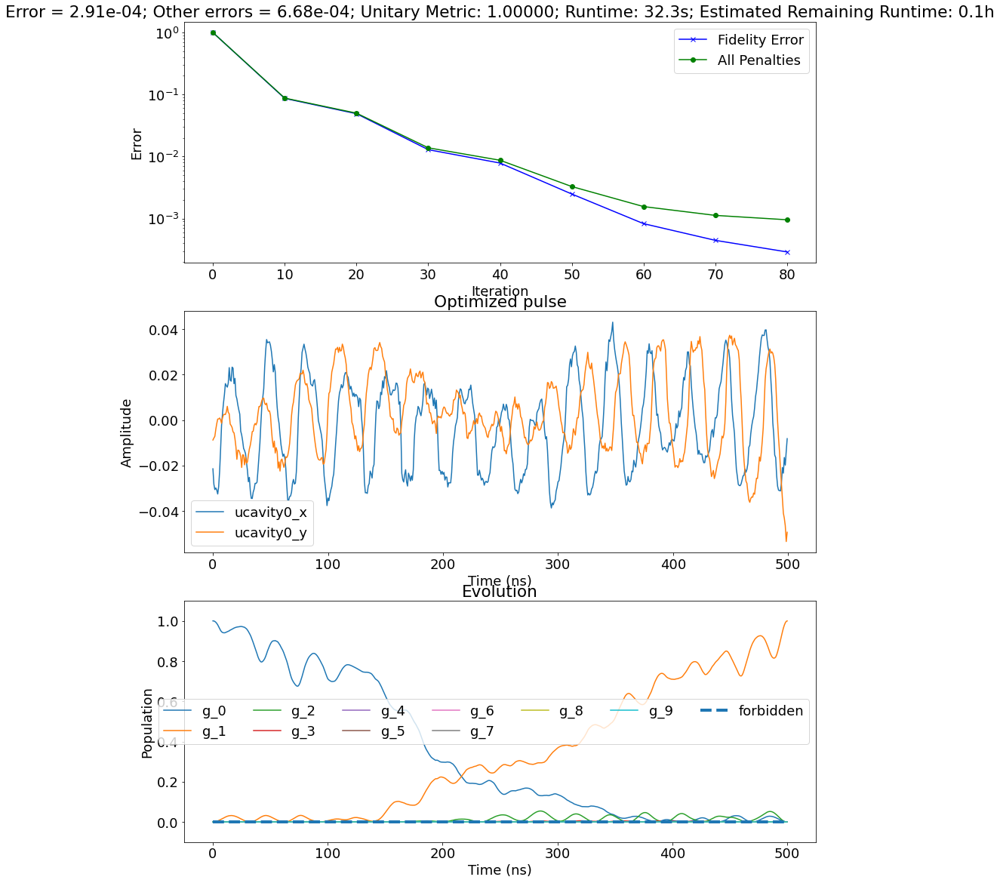

In [27]:
mode = 3
mode_levels = 10
chi,kappa = chis[mode]*1e-3,kappas[mode]*1e-6
circle_grape_params = {"chis":[chi],"kappas":[kappa],"alpha":10.0,"delta_c":-0.030}

op = multimode_circle_grape_optimal_control(mode_state_num = mode_levels,number_of_modes = 1,hparams = circle_grape_params,add_disp_kerr=False)


states_forbidden_list = []
total_time = 500.0
steps  = 600

convergence = {'rate': 0.1, 'update_step': 10, 'max_iterations': 1000,
               'conv_target': 3e-4, 'learning_rate_decay': 500.0}


reg_coeffs = {'dwdt': 0.1, 'd2wdt2': 1.0e-3, 'forbid_dressed': False,
              'states_forbidden_list':states_forbidden_list,
              'forbidden_coeff_list': [1.0*steps] * len(states_forbidden_list)}



initial_guess = None
# initial_guess = np.ones((2, int(steps))) * 2*np.pi * 10.0e-6/np.sqrt(2)
# initial_guess = np.random.normal(loc=0.0, scale=2*np.pi*15e-7, size=(len(Hops), int(steps)))


# expt_name = 'g0_to_g2_blockade'
# file_number = 29
# initial_pulse = "S:/_Data/191018 - Picollo cavity cooldown 15 real\\optimal control pulses\\blockade_pulses\\" + \
#                 str(file_number).zfill(5) + "_" + expt_name.lower()+".h5"

# with h5py.File(initial_pulse,'r') as hf:
#     last_u0 = np.array(hf['uks'])[-1]
# initial_guess = last_u0


op.run_optimal_control(state_transfer = True, initial_states = [0], target_states = [1], 
                        total_time = total_time, steps = steps,max_amp = 10e-3, 
                        taylor_terms = None,is_dressed=False, 
                        convergence = convergence, reg_coeffs =  reg_coeffs,
                        plot_only_g = True,
                        states_forbidden_list = states_forbidden_list,initial_guess = initial_guess, 
                        file_name="g0_to_g1_circlgrape", data_path=data_path)

#  Params :  $\alpha = 10.0 , \delta_c = -0.030$ GHz, $\tau = 100$ ns, $\Omega_{max} =10$ MHz

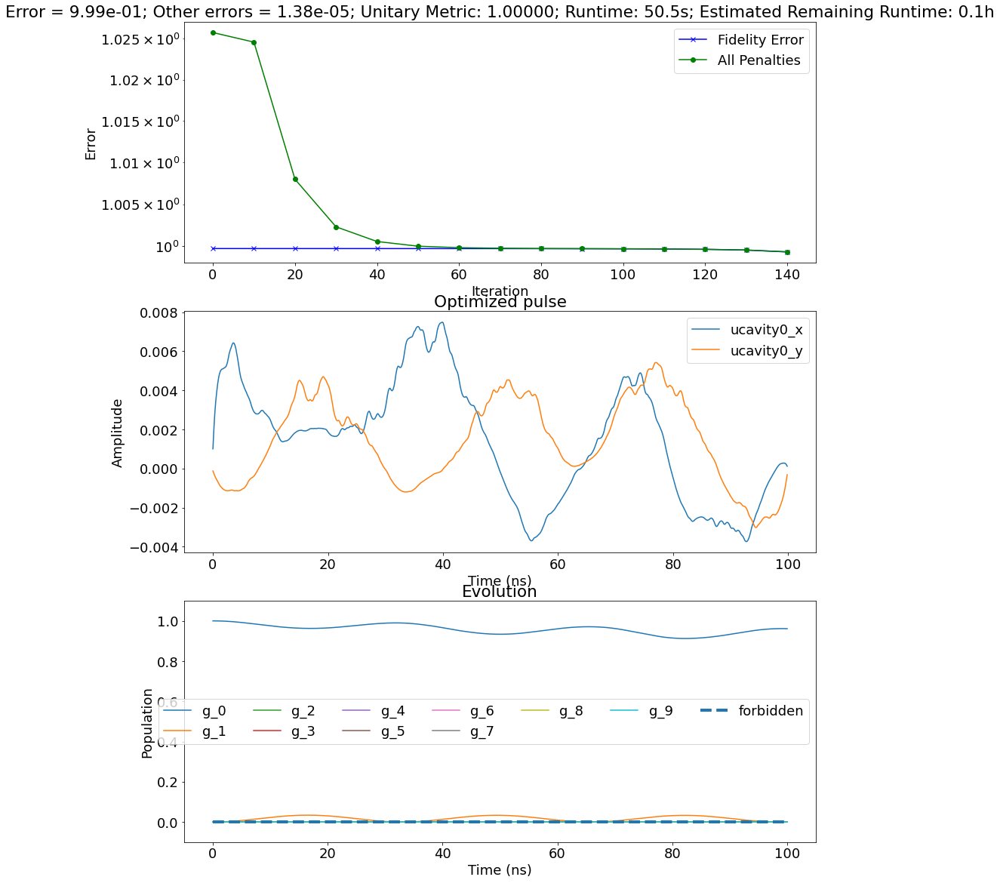

In [28]:
mode = 3
mode_levels = 10
chi,kappa = chis[mode]*1e-3,kappas[mode]*1e-6
circle_grape_params = {"chis":[chi],"kappas":[kappa],"alpha":10.0,"delta_c":-0.030}

op = multimode_circle_grape_optimal_control(mode_state_num = mode_levels,number_of_modes = 1,hparams = circle_grape_params,add_disp_kerr=False)


states_forbidden_list = []
total_time = 100.0
steps  = 600

convergence = {'rate': 0.1, 'update_step': 10, 'max_iterations': 1000,
               'conv_target': 3e-4, 'learning_rate_decay': 500.0}


reg_coeffs = {'dwdt': 0.1, 'd2wdt2': 1.0e-3, 'forbid_dressed': False,
              'states_forbidden_list':states_forbidden_list,
              'forbidden_coeff_list': [1.0*steps] * len(states_forbidden_list)}



initial_guess = None
# initial_guess = np.ones((2, int(steps))) * 2*np.pi * 10.0e-6/np.sqrt(2)
# initial_guess = np.random.normal(loc=0.0, scale=2*np.pi*15e-7, size=(len(Hops), int(steps)))


# expt_name = 'g0_to_g2_blockade'
# file_number = 29
# initial_pulse = "S:/_Data/191018 - Picollo cavity cooldown 15 real\\optimal control pulses\\blockade_pulses\\" + \
#                 str(file_number).zfill(5) + "_" + expt_name.lower()+".h5"

# with h5py.File(initial_pulse,'r') as hf:
#     last_u0 = np.array(hf['uks'])[-1]
# initial_guess = last_u0


op.run_optimal_control(state_transfer = True, initial_states = [0], target_states = [1], 
                        total_time = total_time, steps = steps,max_amp = 10e-3, 
                        taylor_terms = None,is_dressed=False, 
                        convergence = convergence, reg_coeffs =  reg_coeffs,
                        plot_only_g = True,
                        states_forbidden_list = states_forbidden_list,initial_guess = initial_guess, 
                        file_name="g0_to_g1_circlgrape", data_path=data_path)

In [29]:
chi

-0.0011358

#  Params :  $\alpha = 10.0 , \delta_c = -0.030$ GHz, $\tau = 250$ ns, $\Omega_{max} =10$ MHz

C:\_Lib\python\qoc\helper_functions\data_management.py:13: H5pyDeprecationWarning: The default file mode will change to 'r' (read-only) in h5py 3.0. To suppress this warning, pass the mode you need to h5py.File(), or set the global default h5.get_config().default_file_mode, or set the environment variable H5PY_DEFAULT_READONLY=1. Available modes are: 'r', 'r+', 'w', 'w-'/'x', 'a'. See the docs for details.
  h5py.File.__init__(self, *args, **kwargs)


data saved at: D:/_slab/IPython Notebooks/Optimal Control/oct_data/circle_grape_pulses\00004_g0_to_g1_circlgrape.h5


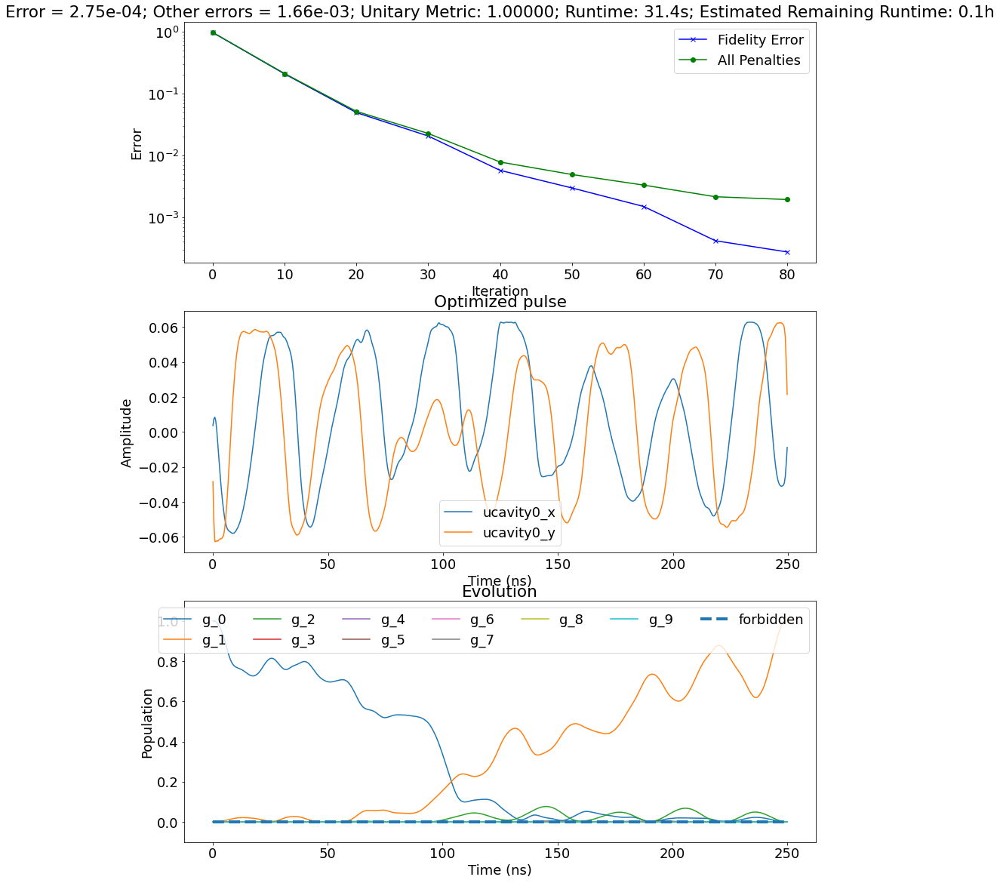

In [30]:
mode = 3
mode_levels = 10
chi,kappa = chis[mode]*1e-3,kappas[mode]*1e-6
circle_grape_params = {"chis":[chi],"kappas":[kappa],"alpha":10.0,"delta_c":-0.030}

op = multimode_circle_grape_optimal_control(mode_state_num = mode_levels,number_of_modes = 1,hparams = circle_grape_params,add_disp_kerr=False)


states_forbidden_list = []
total_time = 250.0
steps  = 600

convergence = {'rate': 0.1, 'update_step': 10, 'max_iterations': 1000,
               'conv_target': 3e-4, 'learning_rate_decay': 500.0}


reg_coeffs = {'dwdt': 0.1, 'd2wdt2': 1.0e-3, 'forbid_dressed': False,
              'states_forbidden_list':states_forbidden_list,
              'forbidden_coeff_list': [1.0*steps] * len(states_forbidden_list)}



initial_guess = None
# initial_guess = np.ones((2, int(steps))) * 2*np.pi * 10.0e-6/np.sqrt(2)
# initial_guess = np.random.normal(loc=0.0, scale=2*np.pi*15e-7, size=(len(Hops), int(steps)))


# expt_name = 'g0_to_g2_blockade'
# file_number = 29
# initial_pulse = "S:/_Data/191018 - Picollo cavity cooldown 15 real\\optimal control pulses\\blockade_pulses\\" + \
#                 str(file_number).zfill(5) + "_" + expt_name.lower()+".h5"

# with h5py.File(initial_pulse,'r') as hf:
#     last_u0 = np.array(hf['uks'])[-1]
# initial_guess = last_u0


op.run_optimal_control(state_transfer = True, initial_states = [0], target_states = [1], 
                        total_time = total_time, steps = steps,max_amp = 10e-3, 
                        taylor_terms = None,is_dressed=False, 
                        convergence = convergence, reg_coeffs =  reg_coeffs,
                        plot_only_g = True,
                        states_forbidden_list = states_forbidden_list,initial_guess = initial_guess, 
                        file_name="g0_to_g1_circlgrape", data_path=data_path)

#  Params :  $\alpha = 10.0 , \delta_c = -0.030$ GHz, $\tau = 150$ ns, $\Omega_{max} =10$ MHz

C:\_Lib\python\qoc\helper_functions\data_management.py:13: H5pyDeprecationWarning: The default file mode will change to 'r' (read-only) in h5py 3.0. To suppress this warning, pass the mode you need to h5py.File(), or set the global default h5.get_config().default_file_mode, or set the environment variable H5PY_DEFAULT_READONLY=1. Available modes are: 'r', 'r+', 'w', 'w-'/'x', 'a'. See the docs for details.
  h5py.File.__init__(self, *args, **kwargs)


data saved at: D:/_slab/IPython Notebooks/Optimal Control/oct_data/circle_grape_pulses\00005_g0_to_g1_circlgrape.h5


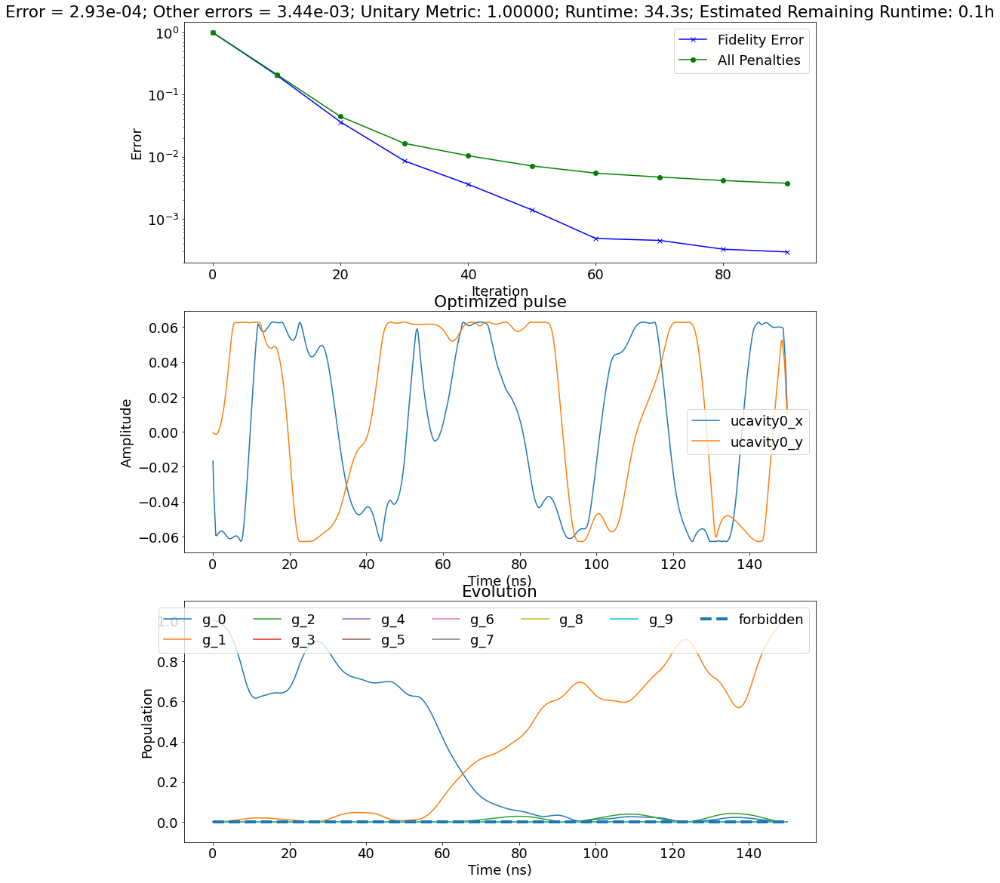

In [36]:
mode = 3
mode_levels = 10
chi,kappa = chis[mode]*1e-3,kappas[mode]*1e-6
circle_grape_params = {"chis":[chi],"kappas":[kappa],"alpha":10.0,"delta_c":-0.030}

op = multimode_circle_grape_optimal_control(mode_state_num = mode_levels,number_of_modes = 1,hparams = circle_grape_params,add_disp_kerr=False)


states_forbidden_list = []
total_time = 150.0
steps  = 600

convergence = {'rate': 0.1, 'update_step': 10, 'max_iterations': 1000,
               'conv_target': 3e-4, 'learning_rate_decay': 500.0}


reg_coeffs = {'dwdt': 0.1, 'd2wdt2': 1.0e-3, 'forbid_dressed': False,
              'states_forbidden_list':states_forbidden_list,
              'forbidden_coeff_list': [1.0*steps] * len(states_forbidden_list)}



initial_guess = None
# initial_guess = np.ones((2, int(steps))) * 2*np.pi * 10.0e-6/np.sqrt(2)
# initial_guess = np.random.normal(loc=0.0, scale=2*np.pi*15e-7, size=(len(Hops), int(steps)))


expt_name = 'g0_to_g1_circlgrape'
file_number = 4
initial_pulse = "D:/_slab/IPython Notebooks/Optimal Control/oct_data/circle_grape_pulses/" + \
                str(file_number).zfill(5) + "_" + expt_name.lower()+".h5"

with h5py.File(initial_pulse,'r') as hf:
    last_u0 = np.array(hf['uks'])[-1]
initial_guess = last_u0


op.run_optimal_control(state_transfer = True, initial_states = [0], target_states = [1], 
                        total_time = total_time, steps = steps,max_amp = 10e-3, 
                        taylor_terms = None,is_dressed=False, 
                        convergence = convergence, reg_coeffs =  reg_coeffs,
                        plot_only_g = True,
                        states_forbidden_list = states_forbidden_list,initial_guess = initial_guess, 
                        file_name="g0_to_g1_circlgrape", data_path=data_path)

#  Params :  $\alpha = 10.0 , \delta_c = -0.030$ GHz, $\tau = 100$ ns, $\Omega_{max} =10$ MHz

C:\_Lib\python\qoc\helper_functions\data_management.py:13: H5pyDeprecationWarning: The default file mode will change to 'r' (read-only) in h5py 3.0. To suppress this warning, pass the mode you need to h5py.File(), or set the global default h5.get_config().default_file_mode, or set the environment variable H5PY_DEFAULT_READONLY=1. Available modes are: 'r', 'r+', 'w', 'w-'/'x', 'a'. See the docs for details.
  h5py.File.__init__(self, *args, **kwargs)


data saved at: D:/_slab/IPython Notebooks/Optimal Control/oct_data/circle_grape_pulses\00006_g0_to_g1_circlgrape.h5


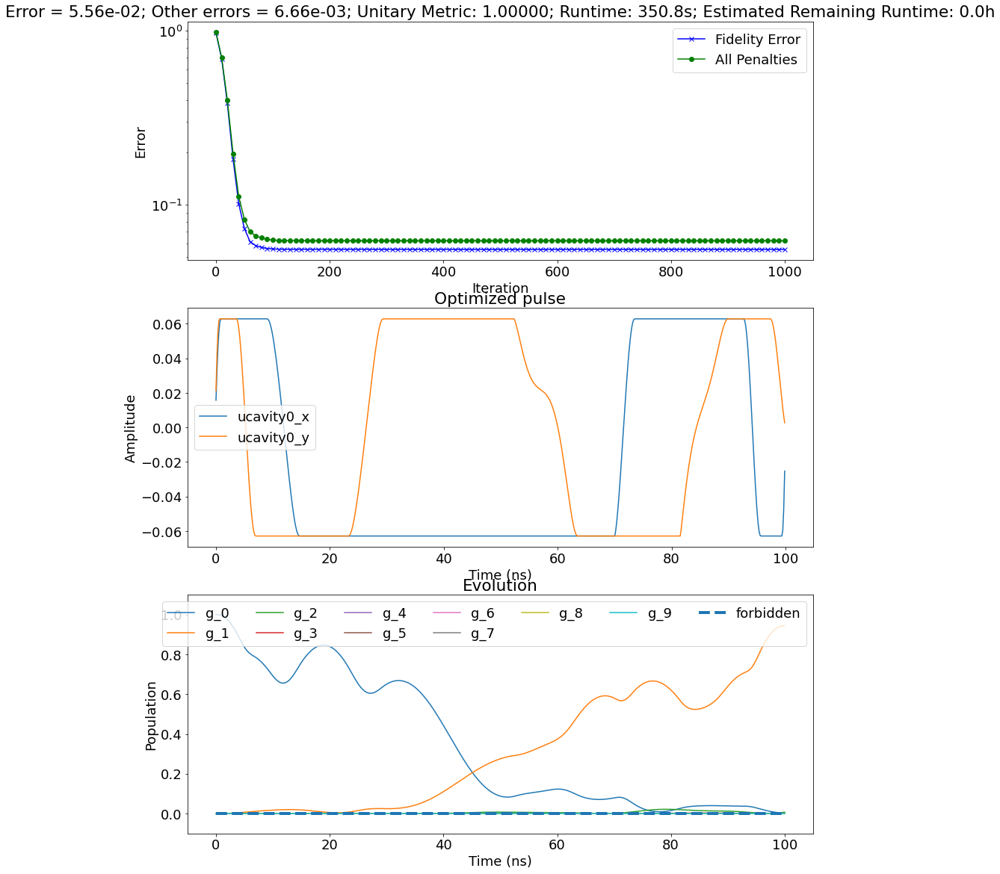

In [37]:
mode = 3
mode_levels = 10
chi,kappa = chis[mode]*1e-3,kappas[mode]*1e-6
circle_grape_params = {"chis":[chi],"kappas":[kappa],"alpha":10.0,"delta_c":-0.030}

op = multimode_circle_grape_optimal_control(mode_state_num = mode_levels,number_of_modes = 1,hparams = circle_grape_params,add_disp_kerr=False)


states_forbidden_list = []
total_time = 100.0
steps  = 600

convergence = {'rate': 0.1, 'update_step': 10, 'max_iterations': 1000,
               'conv_target': 3e-4, 'learning_rate_decay': 500.0}


reg_coeffs = {'dwdt': 0.1, 'd2wdt2': 1.0e-3, 'forbid_dressed': False,
              'states_forbidden_list':states_forbidden_list,
              'forbidden_coeff_list': [1.0*steps] * len(states_forbidden_list)}



initial_guess = None
# initial_guess = np.ones((2, int(steps))) * 2*np.pi * 10.0e-6/np.sqrt(2)
# initial_guess = np.random.normal(loc=0.0, scale=2*np.pi*15e-7, size=(len(Hops), int(steps)))


expt_name = 'g0_to_g1_circlgrape'
file_number = 5
initial_pulse = "D:/_slab/IPython Notebooks/Optimal Control/oct_data/circle_grape_pulses/" + \
                str(file_number).zfill(5) + "_" + expt_name.lower()+".h5"

with h5py.File(initial_pulse,'r') as hf:
    last_u0 = np.array(hf['uks'])[-1]
initial_guess = last_u0


op.run_optimal_control(state_transfer = True, initial_states = [0], target_states = [1], 
                        total_time = total_time, steps = steps,max_amp = 10e-3, 
                        taylor_terms = None,is_dressed=False, 
                        convergence = convergence, reg_coeffs =  reg_coeffs,
                        plot_only_g = True,
                        states_forbidden_list = states_forbidden_list,initial_guess = initial_guess, 
                        file_name="g0_to_g1_circlgrape", data_path=data_path)

#  Params :  $\alpha = 13.0 , \delta_c = -0.040$ GHz, $\tau = 100$ ns, $\Omega_{max} =10$ MHz

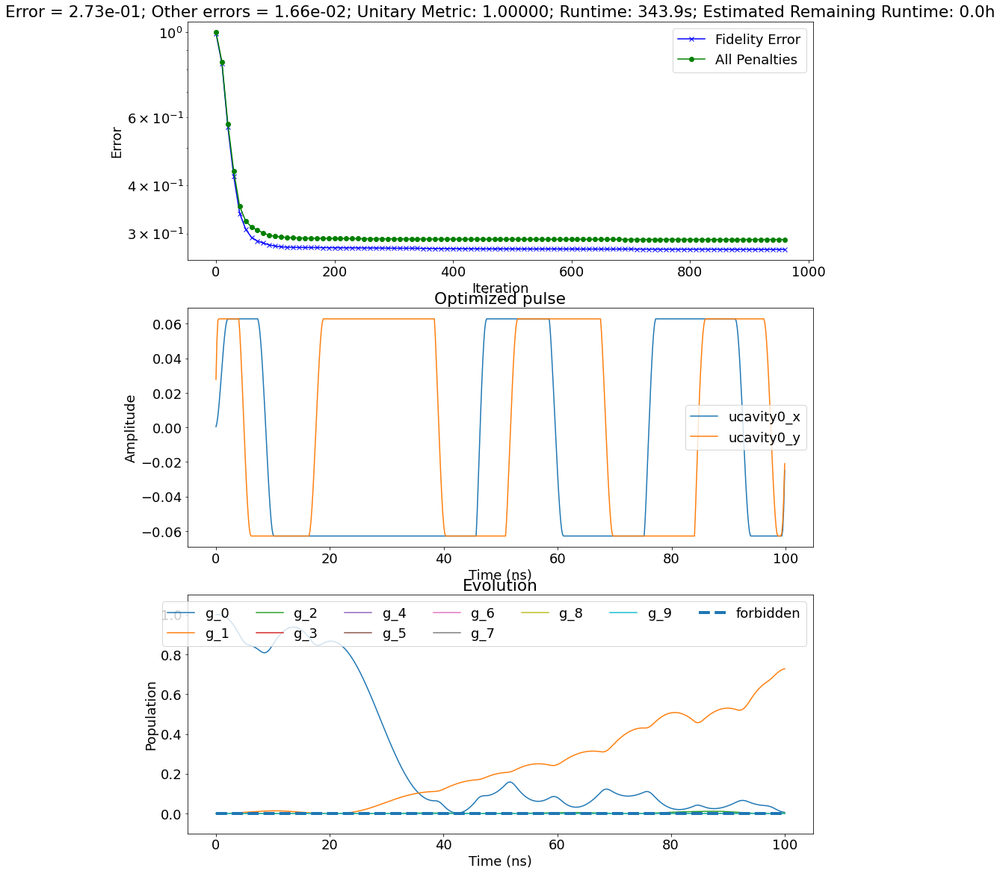

In [38]:
mode = 3
mode_levels = 10
chi,kappa = chis[mode]*1e-3,kappas[mode]*1e-6
circle_grape_params = {"chis":[chi],"kappas":[kappa],"alpha":10.0,"delta_c":-0.040}

op = multimode_circle_grape_optimal_control(mode_state_num = mode_levels,number_of_modes = 1,hparams = circle_grape_params,add_disp_kerr=False)


states_forbidden_list = []
total_time = 100.0
steps  = 600

convergence = {'rate': 0.1, 'update_step': 10, 'max_iterations': 1000,
               'conv_target': 3e-4, 'learning_rate_decay': 500.0}


reg_coeffs = {'dwdt': 0.1, 'd2wdt2': 1.0e-3, 'forbid_dressed': False,
              'states_forbidden_list':states_forbidden_list,
              'forbidden_coeff_list': [1.0*steps] * len(states_forbidden_list)}



initial_guess = None
# initial_guess = np.ones((2, int(steps))) * 2*np.pi * 10.0e-6/np.sqrt(2)
# initial_guess = np.random.normal(loc=0.0, scale=2*np.pi*15e-7, size=(len(Hops), int(steps)))


expt_name = 'g0_to_g1_circlgrape'
file_number = 6
initial_pulse = "D:/_slab/IPython Notebooks/Optimal Control/oct_data/circle_grape_pulses/" + \
                str(file_number).zfill(5) + "_" + expt_name.lower()+".h5"

with h5py.File(initial_pulse,'r') as hf:
    last_u0 = np.array(hf['uks'])[-1]
initial_guess = last_u0


op.run_optimal_control(state_transfer = True, initial_states = [0], target_states = [1], 
                        total_time = total_time, steps = steps,max_amp = 10e-3, 
                        taylor_terms = None,is_dressed=False, 
                        convergence = convergence, reg_coeffs =  reg_coeffs,
                        plot_only_g = True,
                        states_forbidden_list = states_forbidden_list,initial_guess = initial_guess, 
                        file_name="g0_to_g1_circlgrape", data_path=data_path)

#  Params :  $\alpha = 13.0 , \delta_c = -0.030$ GHz, $\tau = 100$ ns, $\Omega_{max} =10$ MHz

C:\_Lib\python\qoc\helper_functions\data_management.py:13: H5pyDeprecationWarning: The default file mode will change to 'r' (read-only) in h5py 3.0. To suppress this warning, pass the mode you need to h5py.File(), or set the global default h5.get_config().default_file_mode, or set the environment variable H5PY_DEFAULT_READONLY=1. Available modes are: 'r', 'r+', 'w', 'w-'/'x', 'a'. See the docs for details.
  h5py.File.__init__(self, *args, **kwargs)


data saved at: D:/_slab/IPython Notebooks/Optimal Control/oct_data/circle_grape_pulses\00008_g0_to_g1_circlgrape.h5


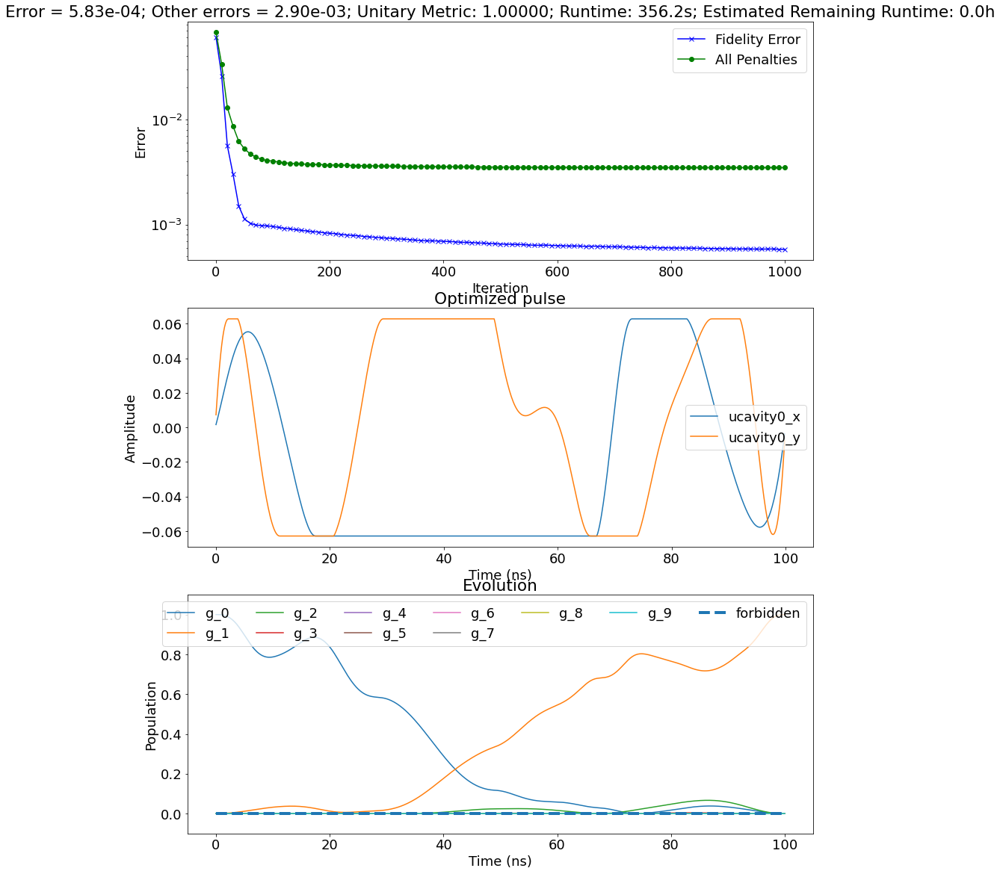

In [39]:
mode = 3
mode_levels = 10
chi,kappa = chis[mode]*1e-3,kappas[mode]*1e-6
circle_grape_params = {"chis":[chi],"kappas":[kappa],"alpha":13.0,"delta_c":-0.030}

op = multimode_circle_grape_optimal_control(mode_state_num = mode_levels,number_of_modes = 1,hparams = circle_grape_params,add_disp_kerr=False)


states_forbidden_list = []
total_time = 100.0
steps  = 600

convergence = {'rate': 0.1, 'update_step': 10, 'max_iterations': 1000,
               'conv_target': 3e-4, 'learning_rate_decay': 500.0}


reg_coeffs = {'dwdt': 0.1, 'd2wdt2': 1.0e-3, 'forbid_dressed': False,
              'states_forbidden_list':states_forbidden_list,
              'forbidden_coeff_list': [1.0*steps] * len(states_forbidden_list)}



initial_guess = None
# initial_guess = np.ones((2, int(steps))) * 2*np.pi * 10.0e-6/np.sqrt(2)
# initial_guess = np.random.normal(loc=0.0, scale=2*np.pi*15e-7, size=(len(Hops), int(steps)))


expt_name = 'g0_to_g1_circlgrape'
file_number = 6
initial_pulse = "D:/_slab/IPython Notebooks/Optimal Control/oct_data/circle_grape_pulses/" + \
                str(file_number).zfill(5) + "_" + expt_name.lower()+".h5"

with h5py.File(initial_pulse,'r') as hf:
    last_u0 = np.array(hf['uks'])[-1]
initial_guess = last_u0


op.run_optimal_control(state_transfer = True, initial_states = [0], target_states = [1], 
                        total_time = total_time, steps = steps,max_amp = 10e-3, 
                        taylor_terms = None,is_dressed=False, 
                        convergence = convergence, reg_coeffs =  reg_coeffs,
                        plot_only_g = True,
                        states_forbidden_list = states_forbidden_list,initial_guess = initial_guess, 
                        file_name="g0_to_g1_circlgrape", data_path=data_path)

#  Params :  $\alpha = 13.0 , \delta_c = -0.030$ GHz, $\tau = 100$ ns, $\Omega_{max} =15$ MHz

C:\_Lib\python\qoc\helper_functions\data_management.py:13: H5pyDeprecationWarning: The default file mode will change to 'r' (read-only) in h5py 3.0. To suppress this warning, pass the mode you need to h5py.File(), or set the global default h5.get_config().default_file_mode, or set the environment variable H5PY_DEFAULT_READONLY=1. Available modes are: 'r', 'r+', 'w', 'w-'/'x', 'a'. See the docs for details.
  h5py.File.__init__(self, *args, **kwargs)


data saved at: D:/_slab/IPython Notebooks/Optimal Control/oct_data/circle_grape_pulses\00009_g0_to_g1_circlgrape.h5


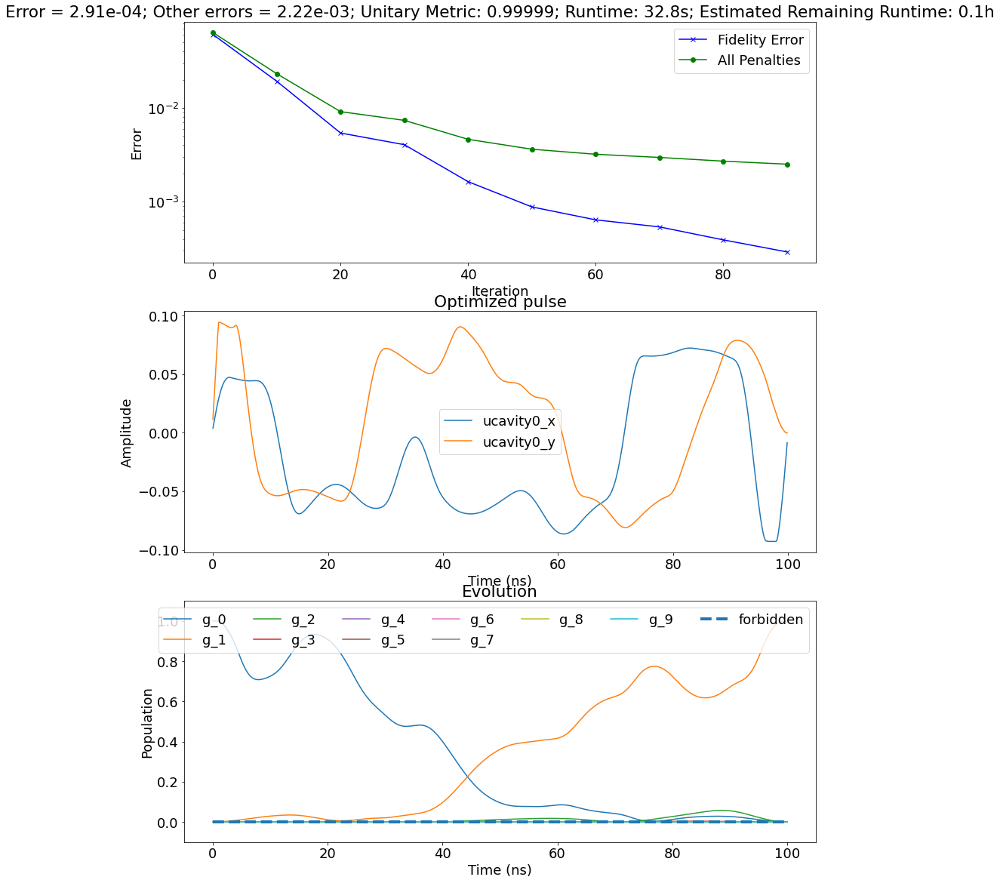

In [41]:
mode = 3
mode_levels = 10
chi,kappa = chis[mode]*1e-3,kappas[mode]*1e-6
circle_grape_params = {"chis":[chi],"kappas":[kappa],"alpha":13.0,"delta_c":-0.030}

op = multimode_circle_grape_optimal_control(mode_state_num = mode_levels,number_of_modes = 1,hparams = circle_grape_params,add_disp_kerr=False)


states_forbidden_list = []
total_time = 100.0
steps  = 600

convergence = {'rate': 0.1, 'update_step': 10, 'max_iterations': 1000,
               'conv_target': 3e-4, 'learning_rate_decay': 500.0}


reg_coeffs = {'dwdt': 0.1, 'd2wdt2': 1.0e-3, 'forbid_dressed': False,
              'states_forbidden_list':states_forbidden_list,
              'forbidden_coeff_list': [1.0*steps] * len(states_forbidden_list)}



initial_guess = None
# initial_guess = np.ones((2, int(steps))) * 2*np.pi * 10.0e-6/np.sqrt(2)
# initial_guess = np.random.normal(loc=0.0, scale=2*np.pi*15e-7, size=(len(Hops), int(steps)))


expt_name = 'g0_to_g1_circlgrape'
file_number = 6
initial_pulse = "D:/_slab/IPython Notebooks/Optimal Control/oct_data/circle_grape_pulses/" + \
                str(file_number).zfill(5) + "_" + expt_name.lower()+".h5"

with h5py.File(initial_pulse,'r') as hf:
    last_u0 = np.array(hf['uks'])[-1]
initial_guess = last_u0


op.run_optimal_control(state_transfer = True, initial_states = [0], target_states = [1], 
                        total_time = total_time, steps = steps,max_amp = 15e-3, 
                        taylor_terms = None,is_dressed=False, 
                        convergence = convergence, reg_coeffs =  reg_coeffs,
                        plot_only_g = True,
                        states_forbidden_list = states_forbidden_list,initial_guess = initial_guess, 
                        file_name="g0_to_g1_circlgrape", data_path=data_path)

#  Params :  $\alpha = 13.0 , \delta_c = -0.005$ GHz, $\tau = 100$ ns, $\Omega_{max} =15$ MHz

C:\_Lib\python\qoc\helper_functions\data_management.py:13: H5pyDeprecationWarning: The default file mode will change to 'r' (read-only) in h5py 3.0. To suppress this warning, pass the mode you need to h5py.File(), or set the global default h5.get_config().default_file_mode, or set the environment variable H5PY_DEFAULT_READONLY=1. Available modes are: 'r', 'r+', 'w', 'w-'/'x', 'a'. See the docs for details.
  h5py.File.__init__(self, *args, **kwargs)


data saved at: D:/_slab/IPython Notebooks/Optimal Control/oct_data/circle_grape_pulses\00010_g0_to_g1_circlgrape.h5


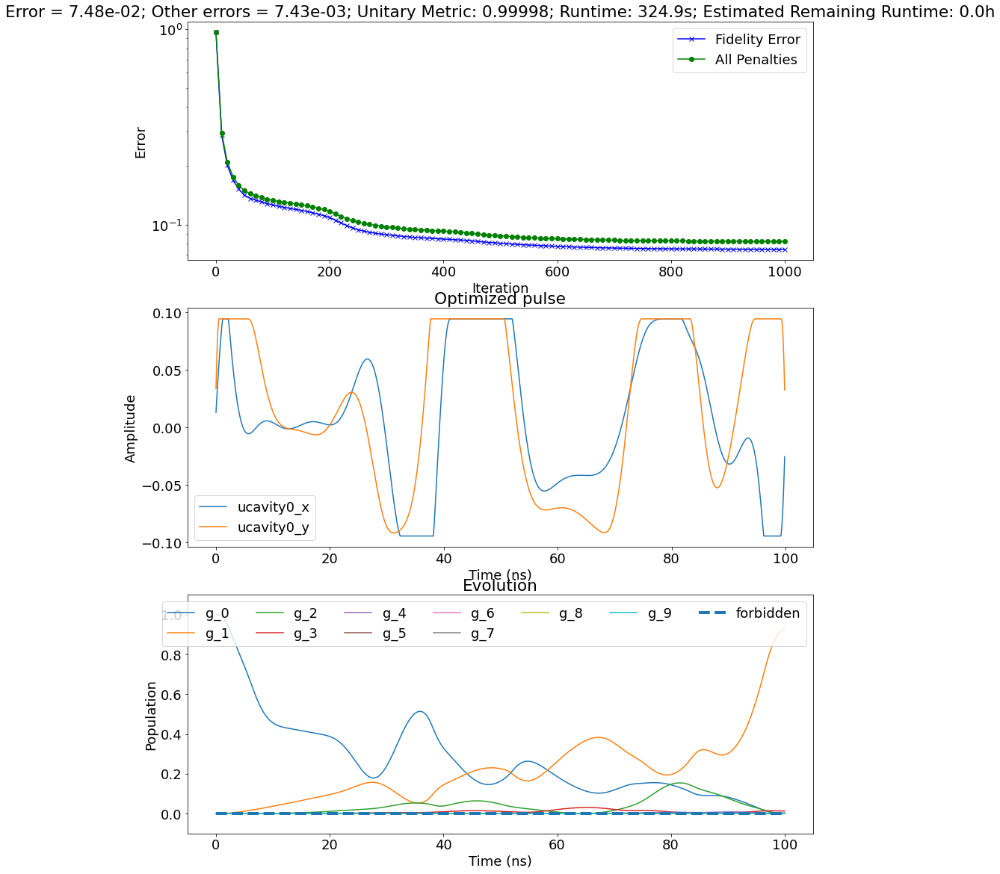

In [42]:
mode = 3
mode_levels = 10
chi,kappa = chis[mode]*1e-3,kappas[mode]*1e-6
circle_grape_params = {"chis":[chi],"kappas":[kappa],"alpha":13.0,"delta_c":-0.005}

op = multimode_circle_grape_optimal_control(mode_state_num = mode_levels,number_of_modes = 1,hparams = circle_grape_params,add_disp_kerr=False)


states_forbidden_list = []
total_time = 100.0
steps  = 600

convergence = {'rate': 0.1, 'update_step': 10, 'max_iterations': 1000,
               'conv_target': 3e-4, 'learning_rate_decay': 500.0}


reg_coeffs = {'dwdt': 0.1, 'd2wdt2': 1.0e-3, 'forbid_dressed': False,
              'states_forbidden_list':states_forbidden_list,
              'forbidden_coeff_list': [1.0*steps] * len(states_forbidden_list)}



initial_guess = None
# initial_guess = np.ones((2, int(steps))) * 2*np.pi * 10.0e-6/np.sqrt(2)
# initial_guess = np.random.normal(loc=0.0, scale=2*np.pi*15e-7, size=(len(Hops), int(steps)))


expt_name = 'g0_to_g1_circlgrape'
file_number = 6
initial_pulse = "D:/_slab/IPython Notebooks/Optimal Control/oct_data/circle_grape_pulses/" + \
                str(file_number).zfill(5) + "_" + expt_name.lower()+".h5"

with h5py.File(initial_pulse,'r') as hf:
    last_u0 = np.array(hf['uks'])[-1]
initial_guess = last_u0


op.run_optimal_control(state_transfer = True, initial_states = [0], target_states = [1], 
                        total_time = total_time, steps = steps,max_amp = 15e-3, 
                        taylor_terms = None,is_dressed=False, 
                        convergence = convergence, reg_coeffs =  reg_coeffs,
                        plot_only_g = True,
                        states_forbidden_list = states_forbidden_list,initial_guess = initial_guess, 
                        file_name="g0_to_g1_circlgrape", data_path=data_path)

 # Params :  $\alpha = 10.0 , \delta_c = -0.005$ GHz, $\tau = 200$ ns, $\Omega_{max} =15$ MHz

In [ ]:
t = 1/3

C:\_Lib\python\qoc\helper_functions\data_management.py:13: H5pyDeprecationWarning: The default file mode will change to 'r' (read-only) in h5py 3.0. To suppress this warning, pass the mode you need to h5py.File(), or set the global default h5.get_config().default_file_mode, or set the environment variable H5PY_DEFAULT_READONLY=1. Available modes are: 'r', 'r+', 'w', 'w-'/'x', 'a'. See the docs for details.
  h5py.File.__init__(self, *args, **kwargs)


data saved at: D:/_slab/IPython Notebooks/Optimal Control/oct_data/circle_grape_pulses\00011_g0_to_g1_circlgrape.h5


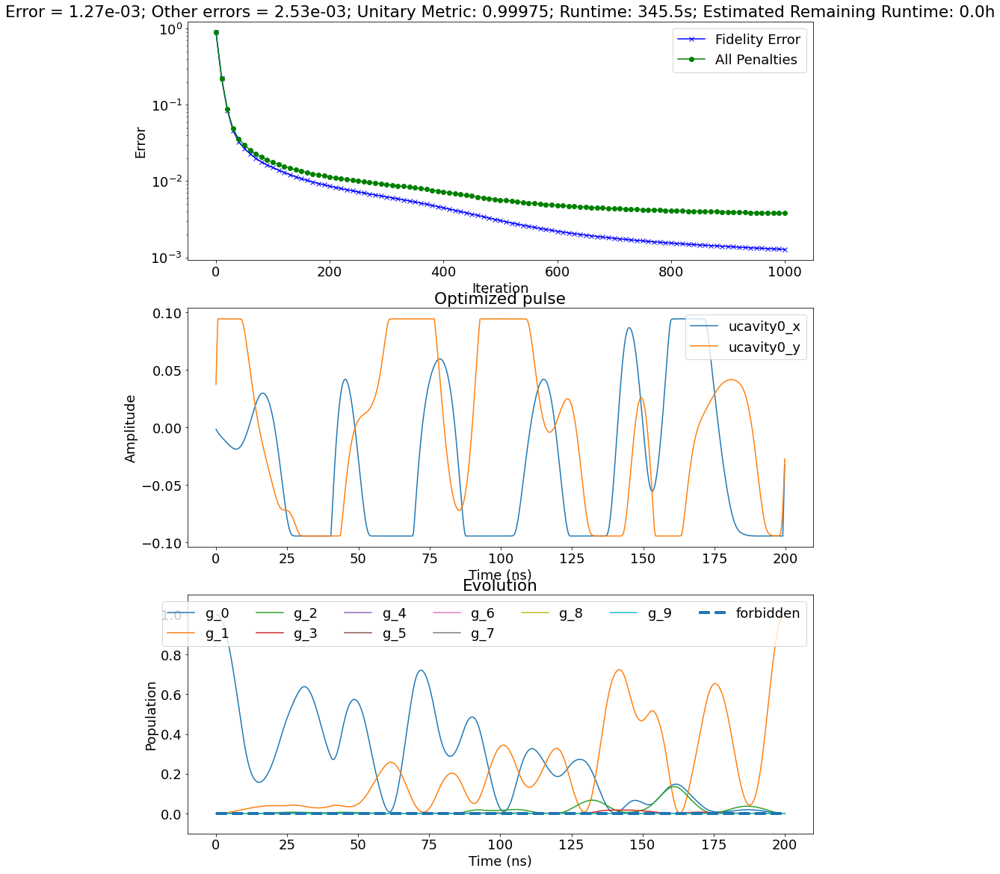

In [45]:
mode = 3
mode_levels = 10
chi,kappa = chis[mode]*1e-3,kappas[mode]*1e-6
circle_grape_params = {"chis":[chi],"kappas":[kappa],"alpha":10.0,"delta_c":-0.005}

op = multimode_circle_grape_optimal_control(mode_state_num = mode_levels,number_of_modes = 1,hparams = circle_grape_params,add_disp_kerr=False)


states_forbidden_list = []
total_time = 200.0
steps  = 600

convergence = {'rate': 0.1, 'update_step': 10, 'max_iterations': 1000,
               'conv_target': 3e-4, 'learning_rate_decay': 500.0}


reg_coeffs = {'dwdt': 0.1, 'd2wdt2': 1.0e-3, 'forbid_dressed': False,
              'states_forbidden_list':states_forbidden_list,
              'forbidden_coeff_list': [1.0*steps] * len(states_forbidden_list)}



initial_guess = None
# initial_guess = np.ones((2, int(steps))) * 2*np.pi * 10.0e-6/np.sqrt(2)
# initial_guess = np.random.normal(loc=0.0, scale=2*np.pi*15e-7, size=(len(Hops), int(steps)))


expt_name = 'g0_to_g1_circlgrape'
file_number = 6
initial_pulse = "D:/_slab/IPython Notebooks/Optimal Control/oct_data/circle_grape_pulses/" + \
                str(file_number).zfill(5) + "_" + expt_name.lower()+".h5"

with h5py.File(initial_pulse,'r') as hf:
    last_u0 = np.array(hf['uks'])[-1]
initial_guess = last_u0


op.run_optimal_control(state_transfer = True, initial_states = [0], target_states = [1], 
                        total_time = total_time, steps = steps,max_amp = 15e-3, 
                        taylor_terms = None,is_dressed=False, 
                        convergence = convergence, reg_coeffs =  reg_coeffs,
                        plot_only_g = True,
                        states_forbidden_list = states_forbidden_list,initial_guess = initial_guess, 
                        file_name="g0_to_g1_circlgrape", data_path=data_path)

In [46]:
expt_name = 'g0_to_g1_circlgrape'
file_number = 6
initial_pulse = "D:/_slab/IPython Notebooks/Optimal Control/oct_data/circle_grape_pulses/" + \
                str(file_number).zfill(5) + "_" + expt_name.lower()+".h5"

In [55]:
with h5py.File(initial_pulse,'r') as hf:
    print (list(hf.keys()))
    print (np.array(hf['error'])[-1])

['H0', 'Hnames', 'Hops', 'U', 'convergence', 'error', 'initial_guess', 'initial_vectors_c', 'inter_vecs_imag', 'inter_vecs_mag_squared', 'inter_vecs_raw_imag', 'inter_vecs_raw_real', 'inter_vecs_real', 'iteration', 'maxA', 'method', 'reg_coeffs', 'reg_error', 'run_time', 'sparse_H', 'sparse_K', 'sparse_U', 'states_concerned_list', 'steps', 'taylor_scaling', 'taylor_terms', 'total_time', 'uks', 'unitary_scale', 'use_gpu', 'wall_clock_time']
0.055556476


In [68]:
tlist = flip(append(linspace(100,200,5),linspace(200,1000,5)))

In [69]:
tlist

array([1000.,  800.,  600.,  400.,  200.,  200.,  175.,  150.,  125.,
        100.])

 # Params :  $\alpha = 10.0 , \delta_c = -0.025$ GHz, $\Omega_{max} =15$ MHz, mode 3

C:\_Lib\python\qoc\helper_functions\data_management.py:13: H5pyDeprecationWarning: The default file mode will change to 'r' (read-only) in h5py 3.0. To suppress this warning, pass the mode you need to h5py.File(), or set the global default h5.get_config().default_file_mode, or set the environment variable H5PY_DEFAULT_READONLY=1. Available modes are: 'r', 'r+', 'w', 'w-'/'x', 'a'. See the docs for details.
  h5py.File.__init__(self, *args, **kwargs)


data saved at: D:/_slab/IPython Notebooks/Optimal Control/oct_data/circle_grape_pulses\00009_g0_to_g1_circlgrape_lp.h5


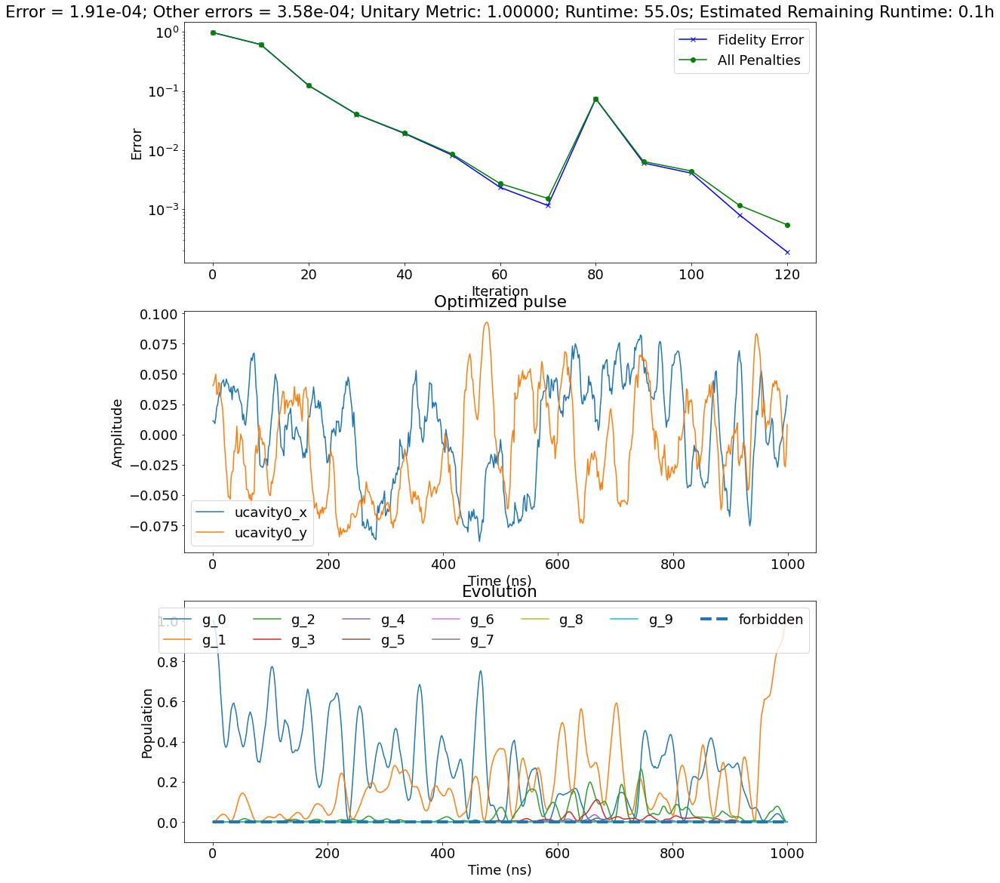

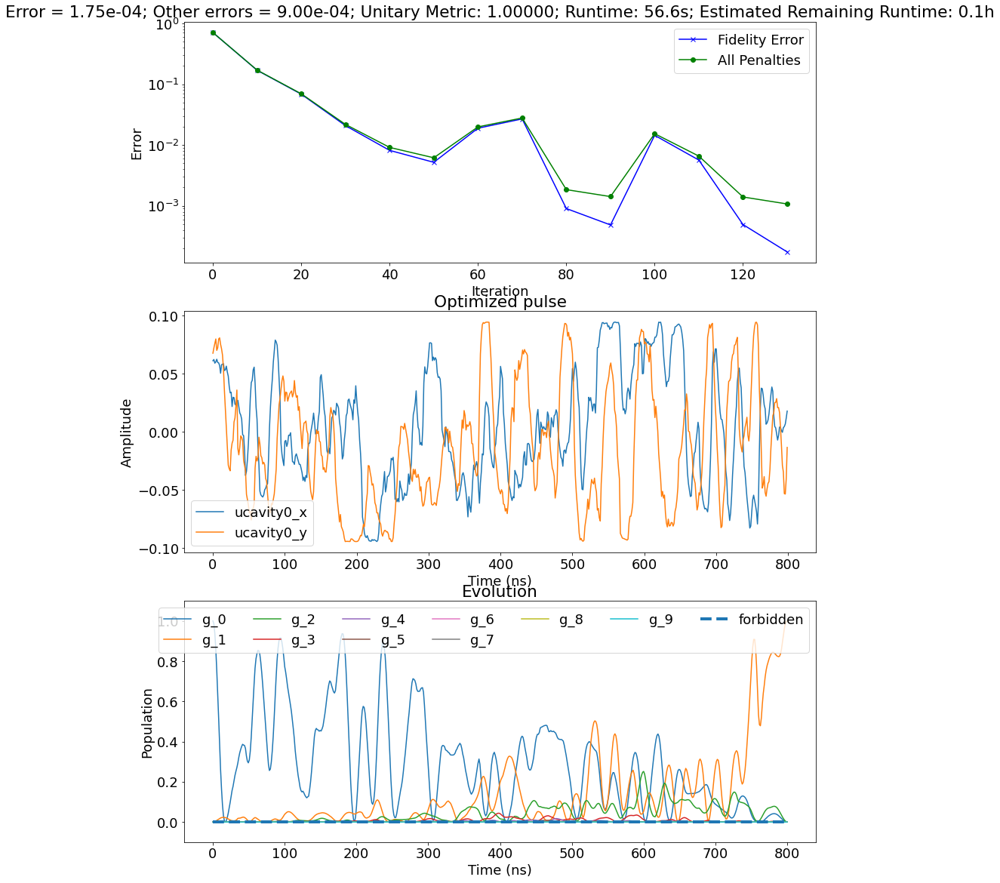

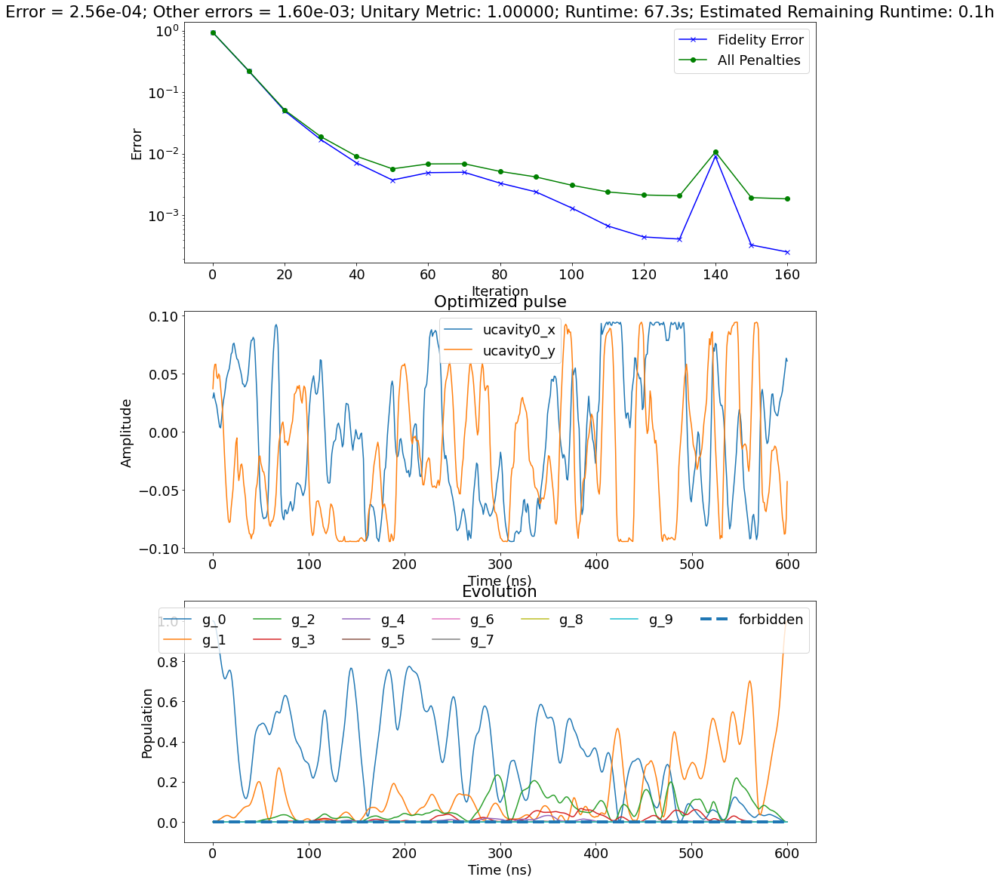

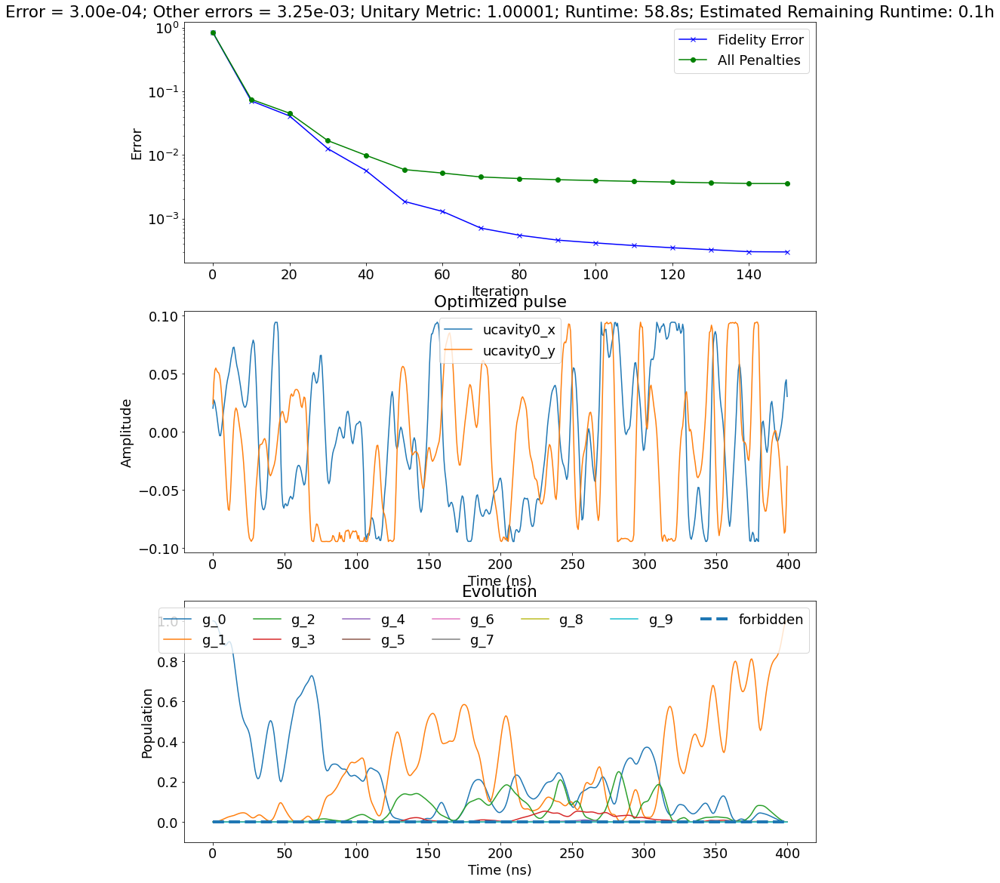

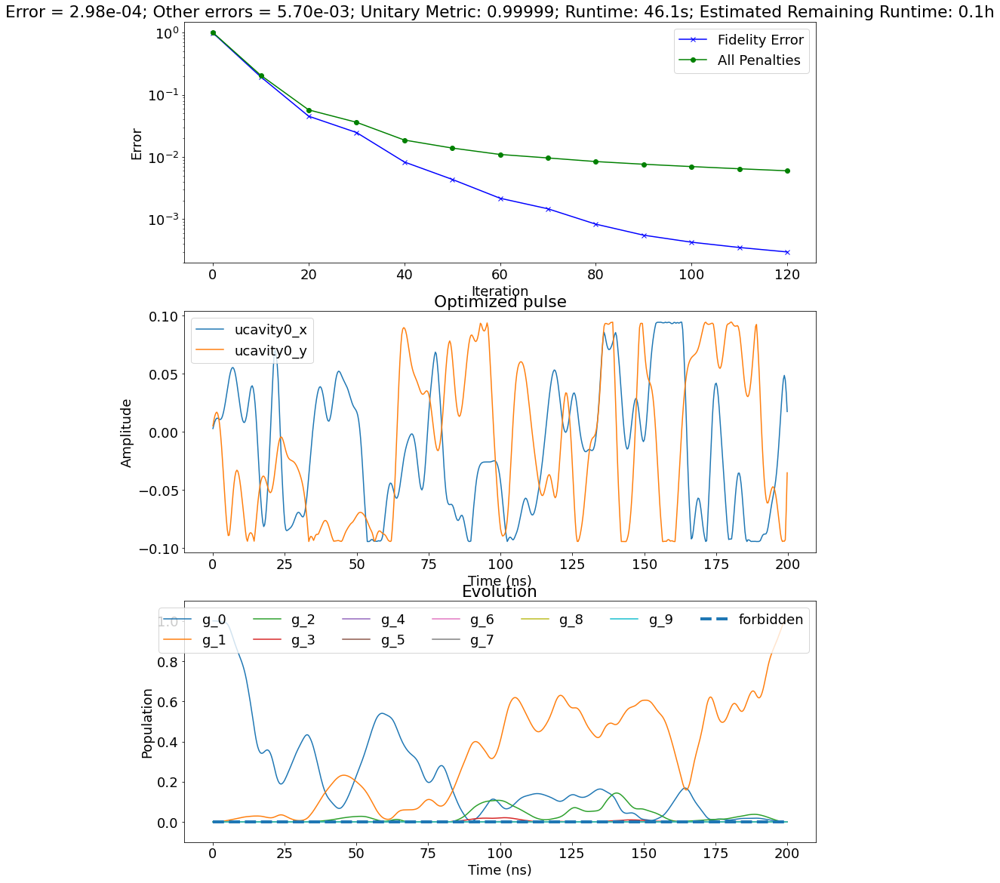

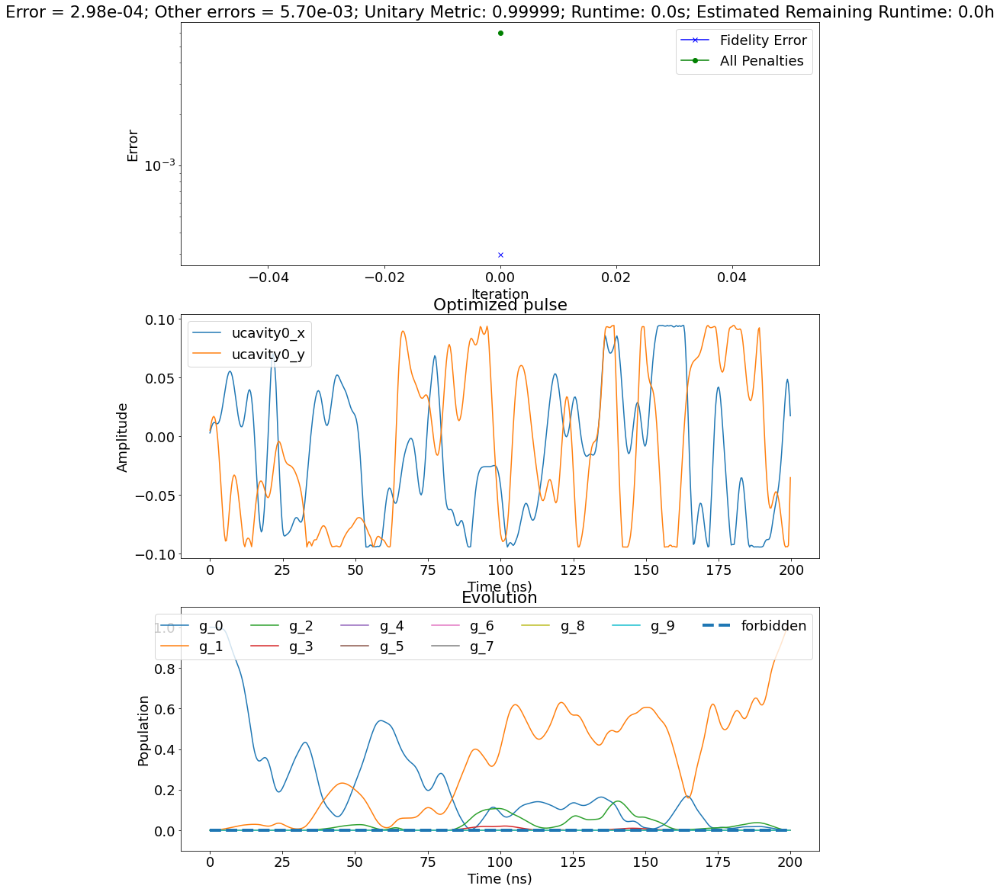

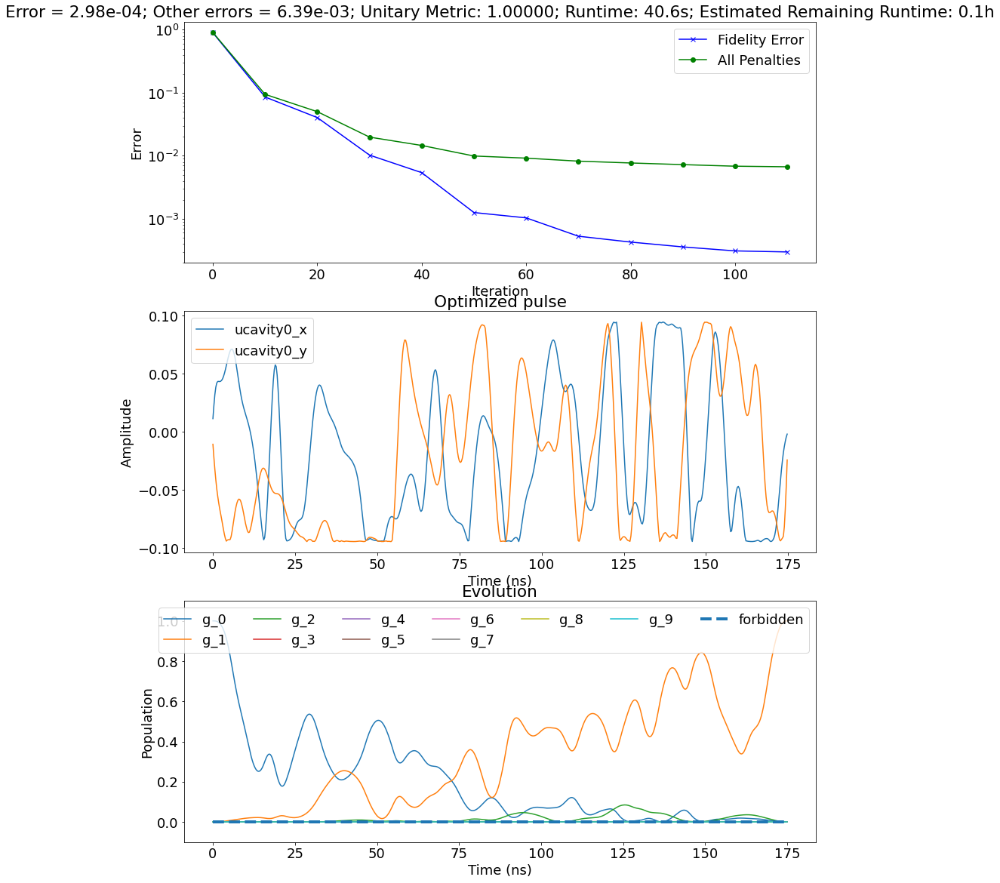

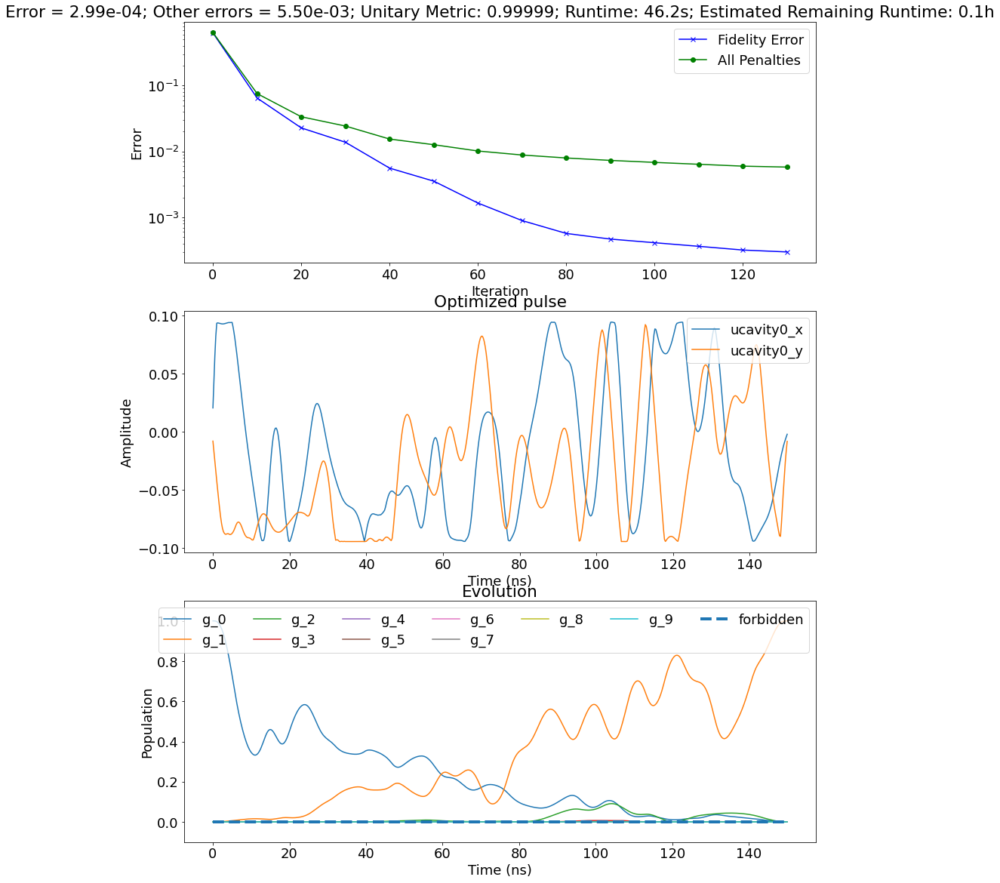

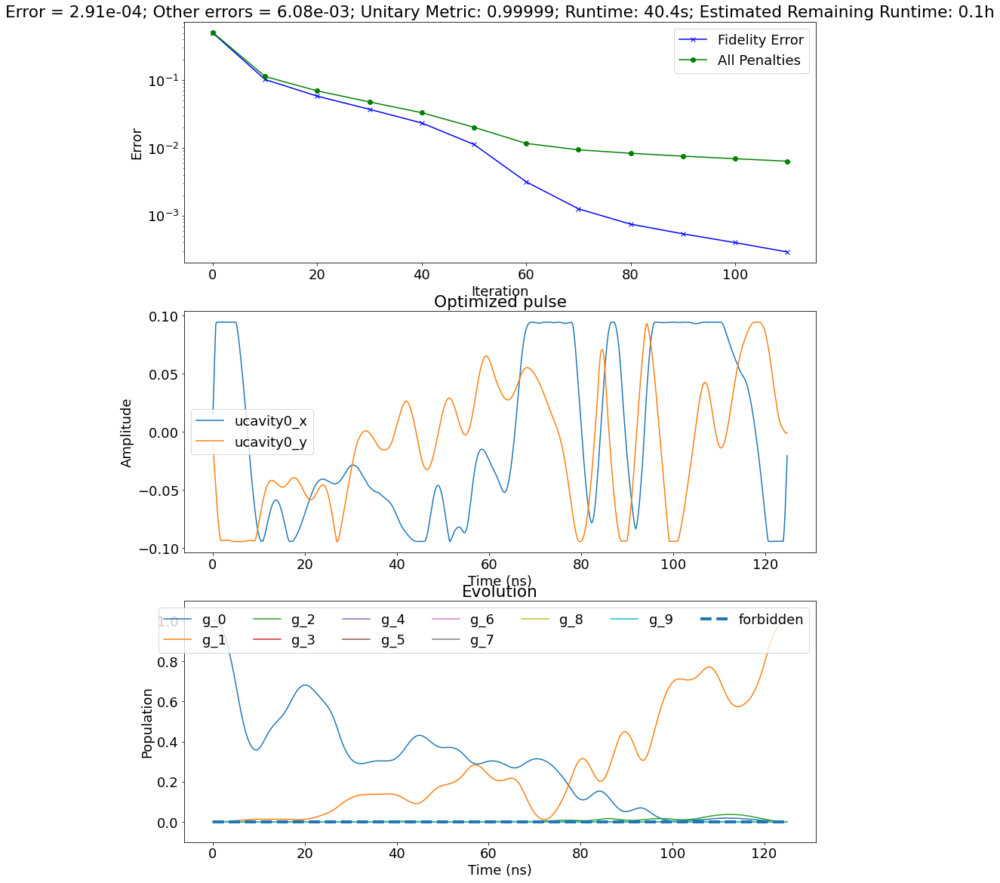

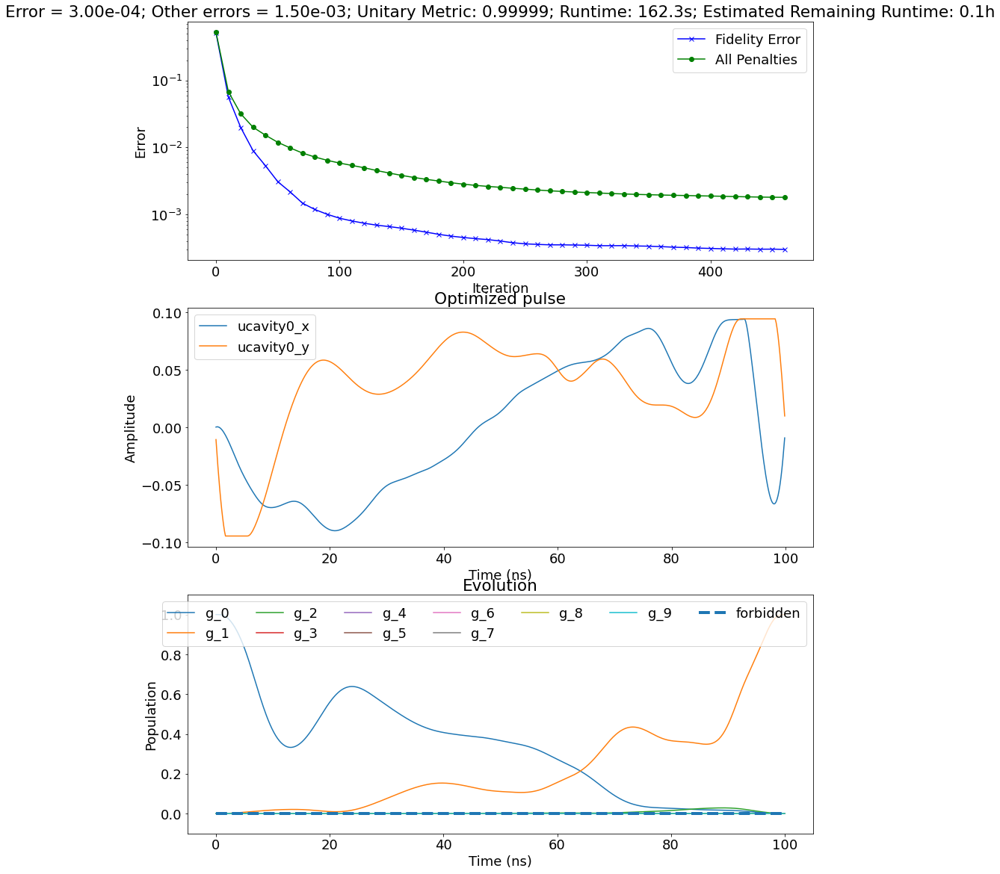

In [70]:
mode = 3
mode_levels = 10
chi,kappa = chis[mode]*1e-3,kappas[mode]*1e-6
circle_grape_params = {"chis":[chi],"kappas":[kappa],"alpha":10.0,"delta_c":-0.025}

for ii,time in enumerate(tlist):

    op = multimode_circle_grape_optimal_control(mode_state_num = mode_levels,number_of_modes = 1,hparams = circle_grape_params,add_disp_kerr=False)


    states_forbidden_list = []
    total_time = time
    print (time)
    steps  = 600

    convergence = {'rate': 0.1, 'update_step': 10, 'max_iterations': 1000,
                   'conv_target': 3e-4, 'learning_rate_decay': 500.0}


    reg_coeffs = {'dwdt': 0.1, 'd2wdt2': 1.0e-3, 'forbid_dressed': False,
                  'states_forbidden_list':states_forbidden_list,
                  'forbidden_coeff_list': [1.0*steps] * len(states_forbidden_list)}


    if ii is 0:
        initial_guess = None

    else:
        expt_name = 'g0_to_g1_circlgrape_lp'
        file_number = ii-1
        initial_pulse = "D:/_slab/IPython Notebooks/Optimal Control/oct_data/circle_grape_pulses/" + \
                        str(file_number).zfill(5) + "_" + expt_name.lower()+".h5"

        with h5py.File(initial_pulse,'r') as hf:
            last_u0 = np.array(hf['uks'])[-1]
        initial_guess = last_u0


    op.run_optimal_control(state_transfer = True, initial_states = [0], target_states = [1], 
                            total_time = total_time, steps = steps,max_amp = 15e-3, 
                            taylor_terms = None,is_dressed=False, 
                            convergence = convergence, reg_coeffs =  reg_coeffs,
                            plot_only_g = True,
                            states_forbidden_list = states_forbidden_list,initial_guess = initial_guess, 
                            file_name="g0_to_g1_circlgrape_lp", data_path=data_path)

In [77]:
errorll = []
tll = []
paramval = []

errorll.append(errorlist)
tll.append(tlist)
paramval.append(circle_grape_params)

In [72]:
errorlist = []

for ii in range(len(tlist)):
    expt_name = 'g0_to_g1_circlgrape_lp'
    file_number = ii
    fn = "D:/_slab/IPython Notebooks/Optimal Control/oct_data/circle_grape_pulses/" + \
                    str(file_number).zfill(5) + "_" + expt_name.lower()+".h5"

    with h5py.File(fn,'r') as hf:
        print ("Error = ",np.array(hf['error'])[-1])
        errorlist.append(np.array(hf['error'])[-1])

Error =  0.00019085407
Error =  0.00017470121
Error =  0.00025588274
Error =  0.00029993057
Error =  0.00029814243
Error =  0.00029802322
Error =  0.0002977848
Error =  0.00029861927
Error =  0.0002911687
Error =  0.00029987097



 
 ## Error vs time

Text(0, 0.5, 'Error')

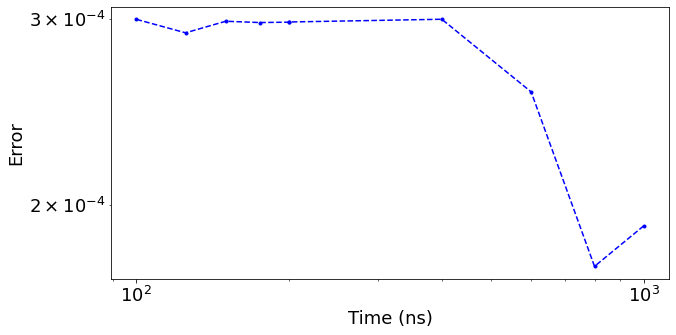

In [79]:
fig,ax = plt.subplots(1,1,figsize=(10,5))
ax.loglog(tlist,array(errorlist),'b.--')
ax.set_xlabel('Time (ns)')
ax.set_ylabel('Error')

In [80]:
tlsit = linspace(1000,100,10)

C:\_Lib\python\qoc\helper_functions\data_management.py:13: H5pyDeprecationWarning: The default file mode will change to 'r' (read-only) in h5py 3.0. To suppress this warning, pass the mode you need to h5py.File(), or set the global default h5.get_config().default_file_mode, or set the environment variable H5PY_DEFAULT_READONLY=1. Available modes are: 'r', 'r+', 'w', 'w-'/'x', 'a'. See the docs for details.
  h5py.File.__init__(self, *args, **kwargs)


data saved at: D:/_slab/IPython Notebooks/Optimal Control/oct_data/circle_grape_pulses\00009_g0_to_g1_circlgrape_alpha_5.h5


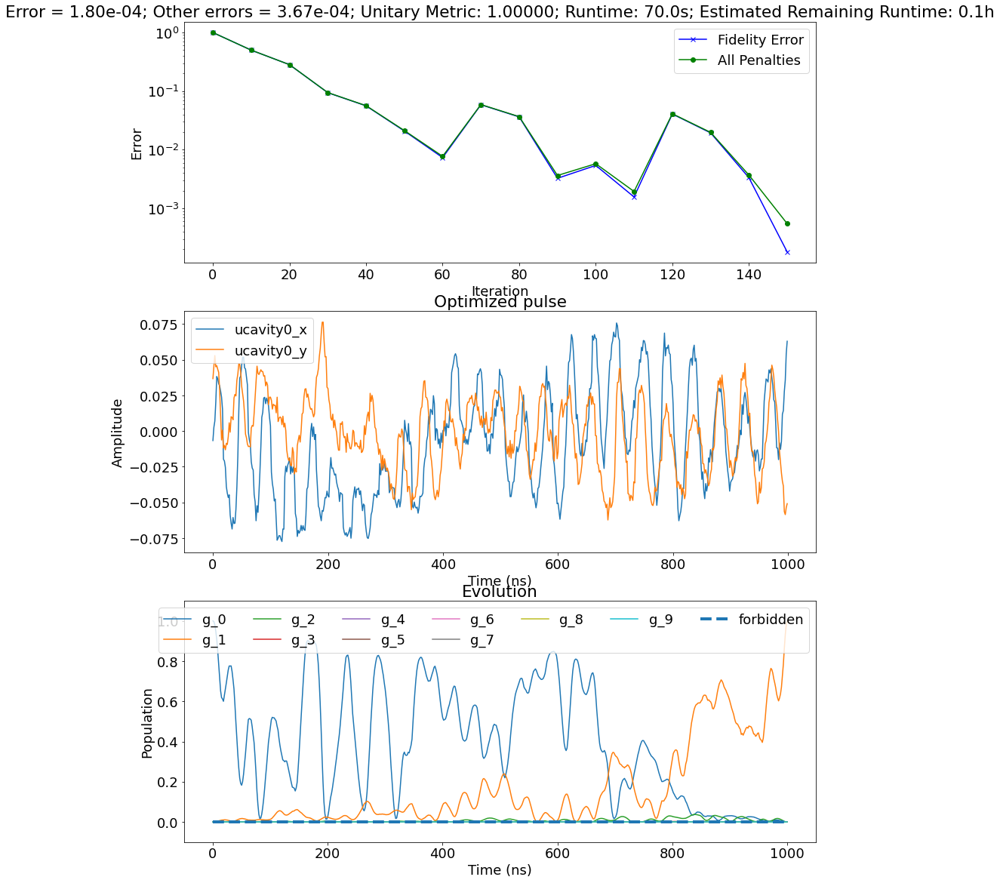

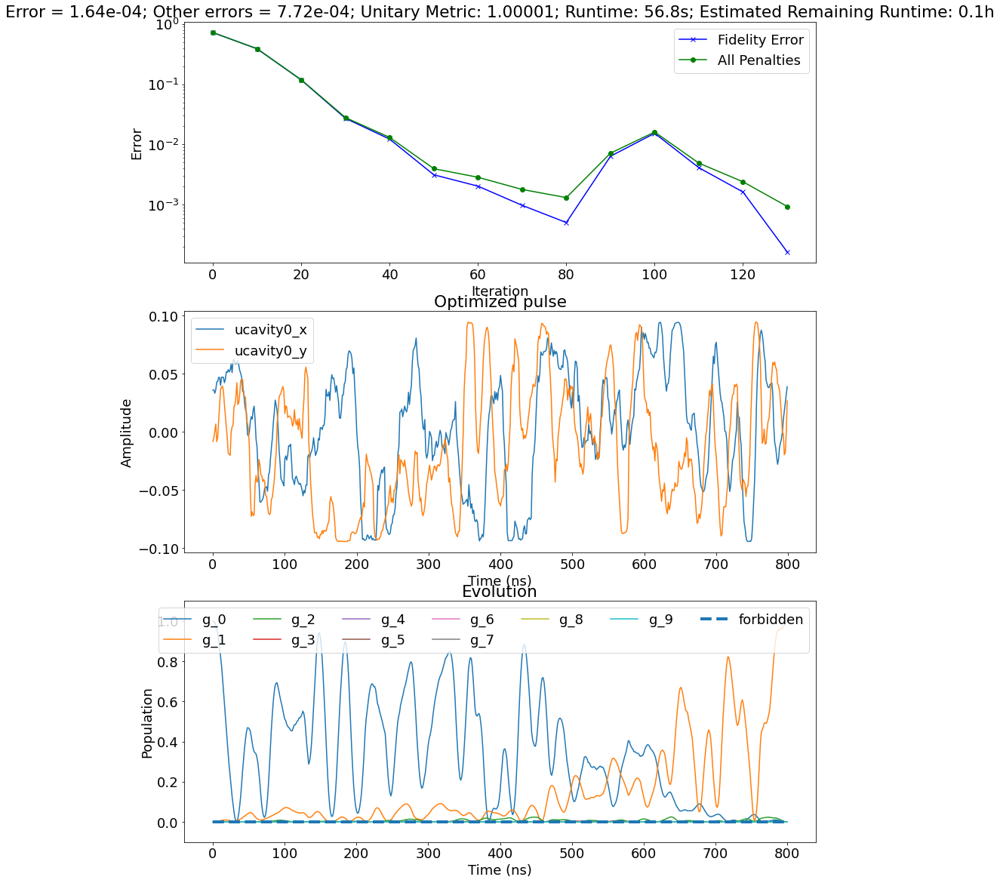

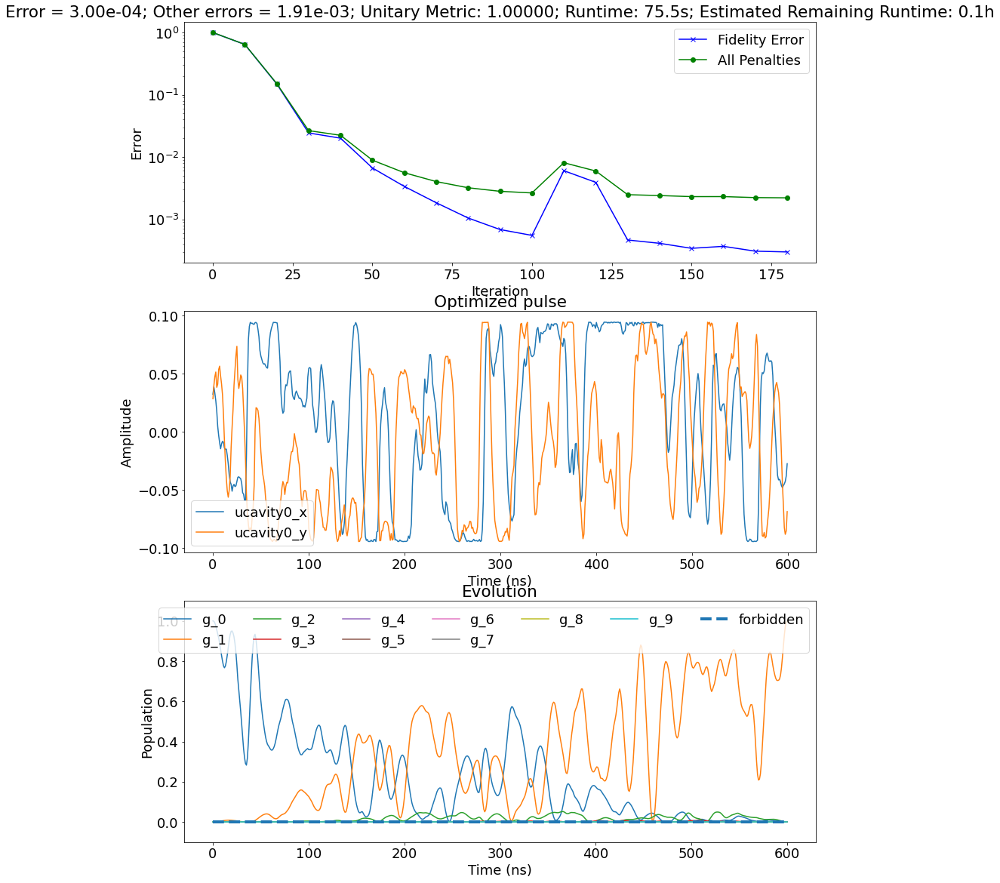

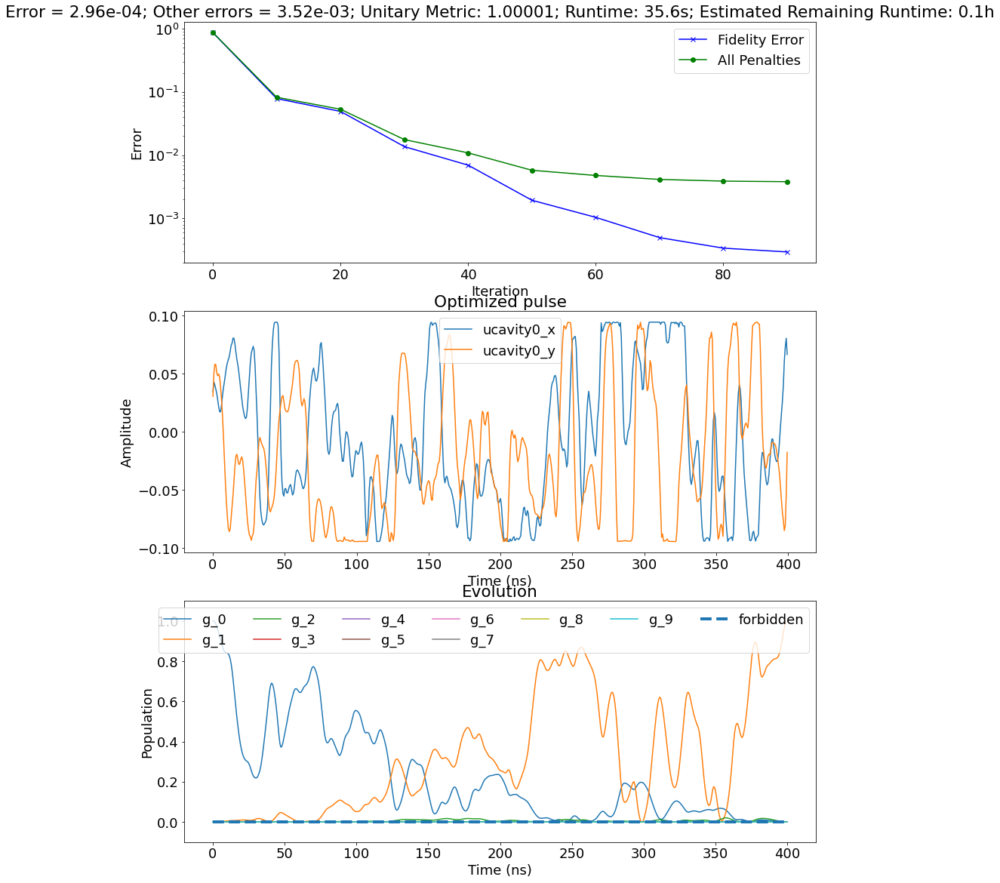

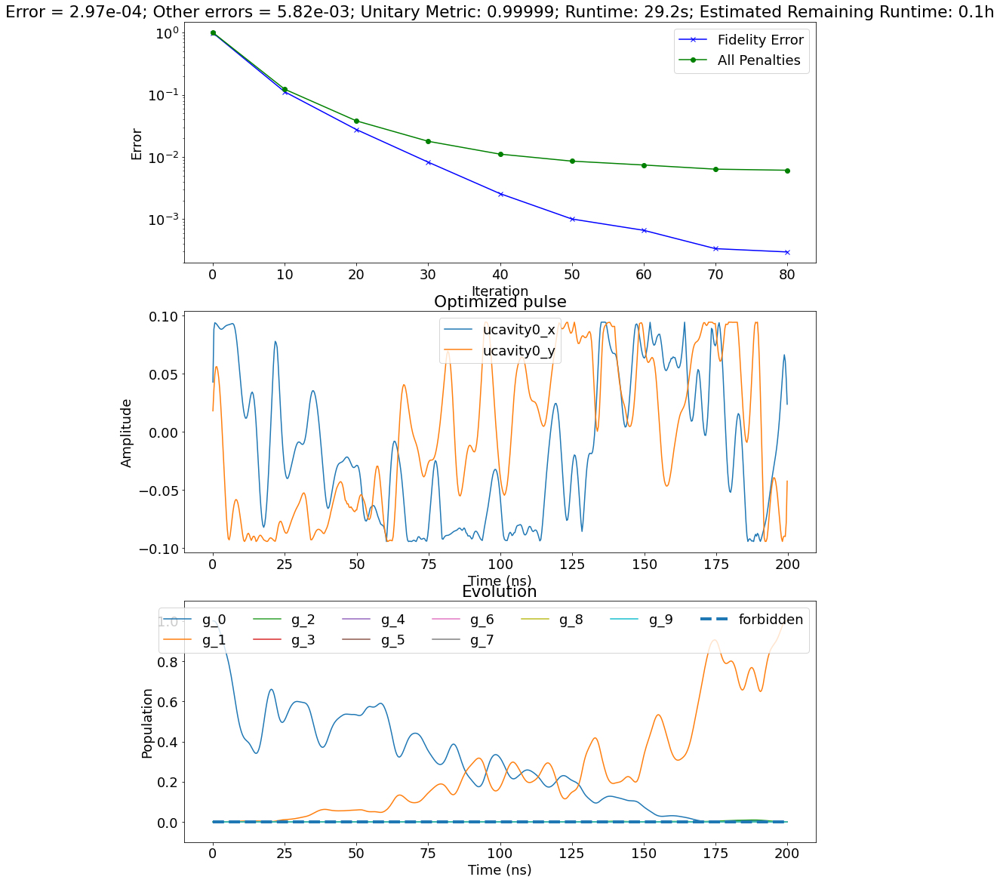

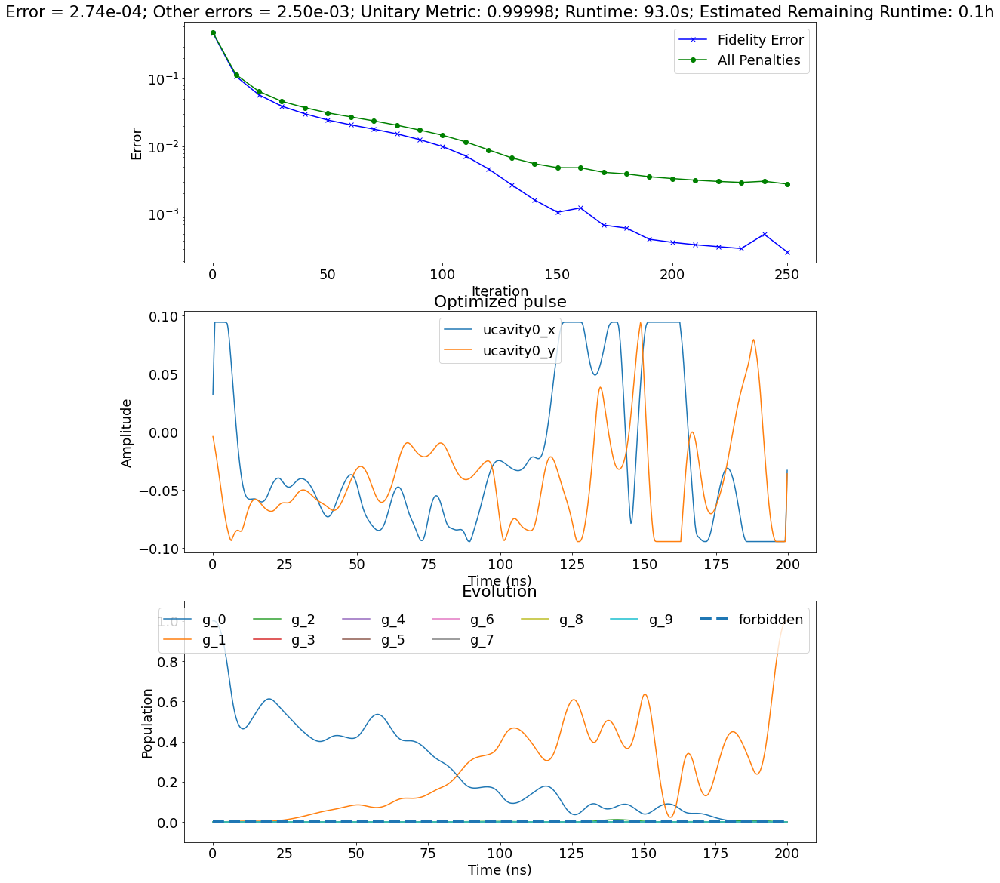

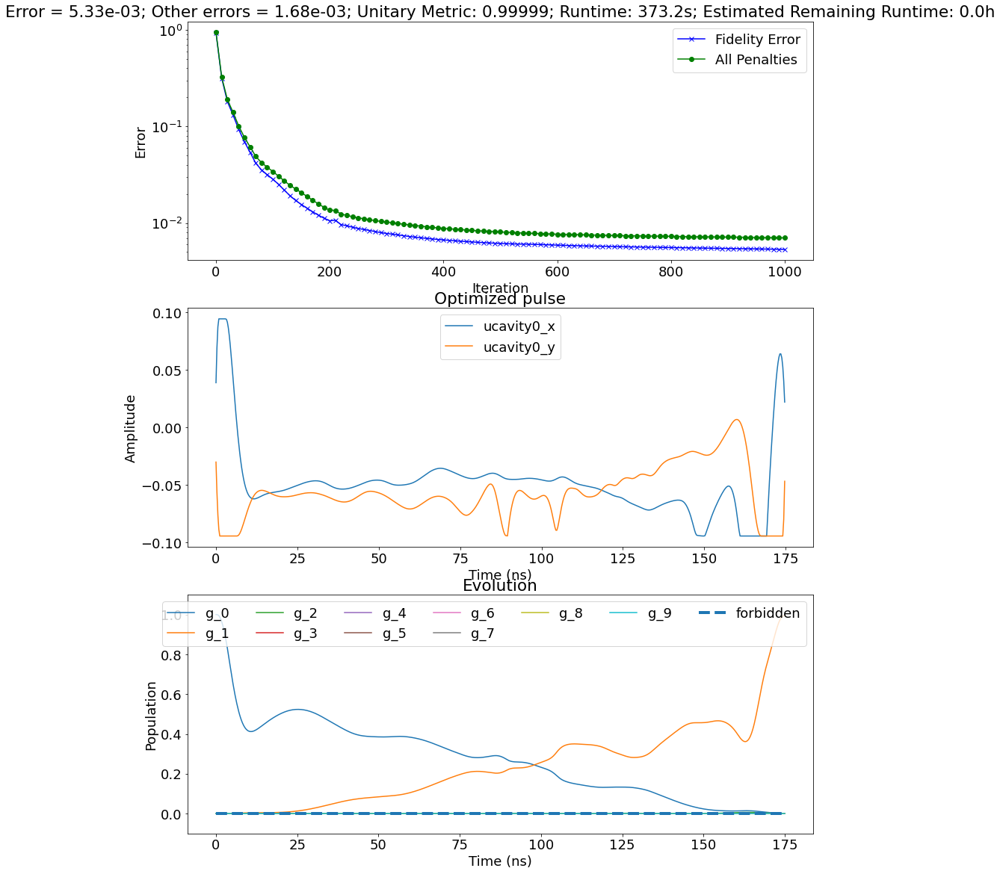

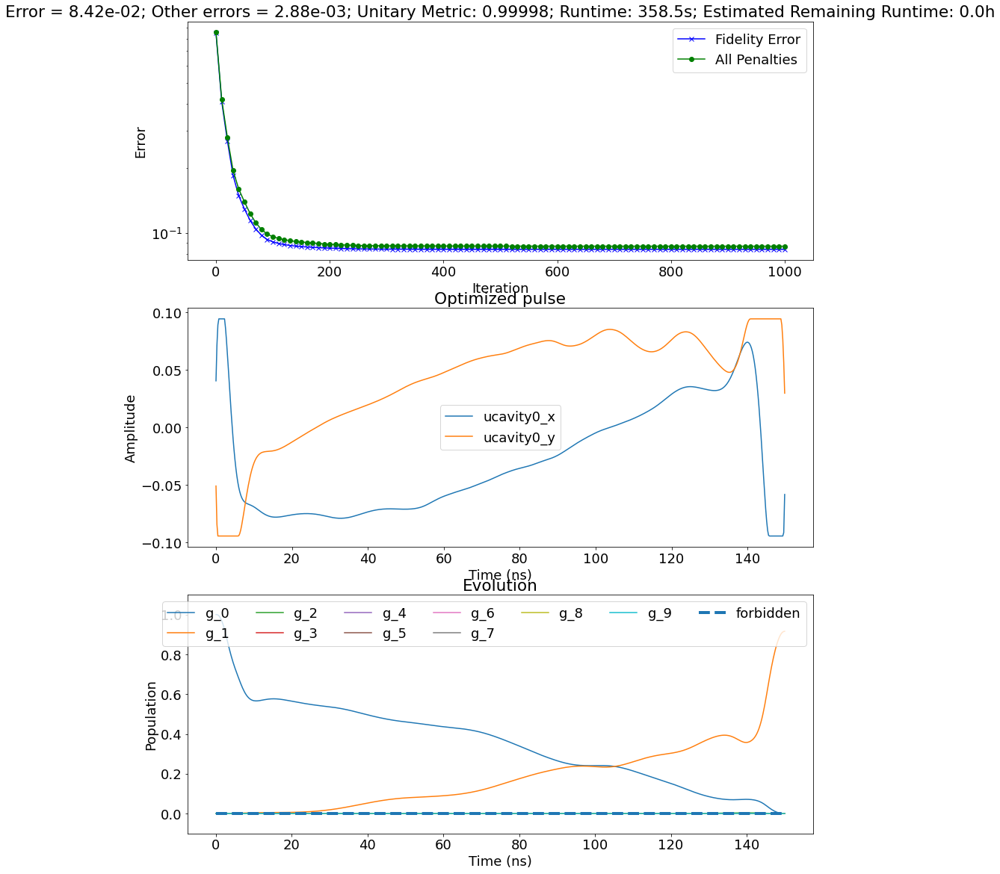

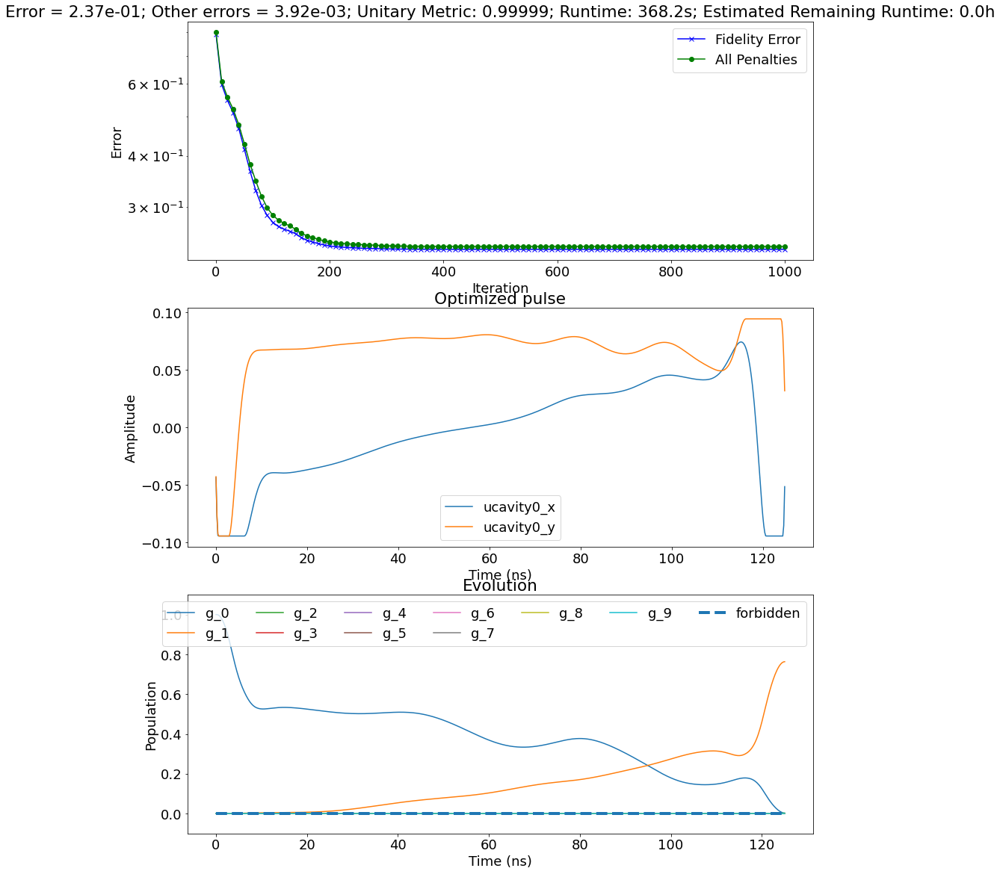

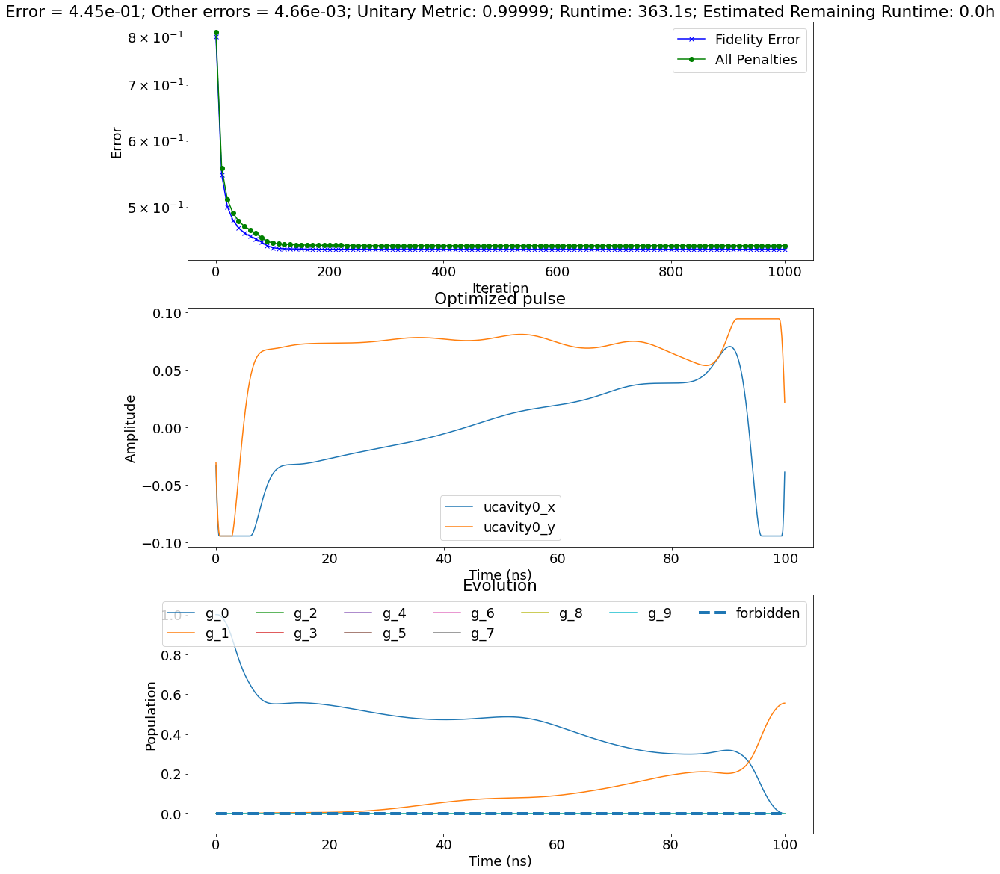

In [81]:
mode = 3
mode_levels = 10
chi,kappa = chis[mode]*1e-3,kappas[mode]*1e-6
circle_grape_params = {"chis":[chi],"kappas":[kappa],"alpha":5.0,"delta_c":-0.025}

for ii,time in enumerate(tlist):

    op = multimode_circle_grape_optimal_control(mode_state_num = mode_levels,number_of_modes = 1,hparams = circle_grape_params,add_disp_kerr=False)


    states_forbidden_list = []
    total_time = time
    print (time)
    steps  = 600

    convergence = {'rate': 0.1, 'update_step': 10, 'max_iterations': 1000,
                   'conv_target': 3e-4, 'learning_rate_decay': 500.0}


    reg_coeffs = {'dwdt': 0.1, 'd2wdt2': 1.0e-3, 'forbid_dressed': False,
                  'states_forbidden_list':states_forbidden_list,
                  'forbidden_coeff_list': [1.0*steps] * len(states_forbidden_list)}


    if ii is 0:
        initial_guess = None

    else:
        expt_name = 'g0_to_g1_circlgrape_lp'
        file_number = ii-1
        initial_pulse = "D:/_slab/IPython Notebooks/Optimal Control/oct_data/circle_grape_pulses/" + \
                        str(file_number).zfill(5) + "_" + expt_name.lower()+".h5"

        with h5py.File(initial_pulse,'r') as hf:
            last_u0 = np.array(hf['uks'])[-1]
        initial_guess = last_u0


    op.run_optimal_control(state_transfer = True, initial_states = [0], target_states = [1], 
                            total_time = total_time, steps = steps,max_amp = 15e-3, 
                            taylor_terms = None,is_dressed=False, 
                            convergence = convergence, reg_coeffs =  reg_coeffs,
                            plot_only_g = True,
                            states_forbidden_list = states_forbidden_list,initial_guess = initial_guess, 
                            file_name="g0_to_g1_circlgrape_alpha_5", data_path=data_path)

In [116]:
tlist 

array([1000.,  800.,  600.,  400.,  200.,  200.,  175.,  150.,  125.,
        100.])

In [82]:
errorlist = []

for ii in range(len(tlist)):
    expt_name = 'g0_to_g1_circlgrape_alpha_5'
    file_number = ii
    fn = "D:/_slab/IPython Notebooks/Optimal Control/oct_data/circle_grape_pulses/" + \
                    str(file_number).zfill(5) + "_" + expt_name.lower()+".h5"

    with h5py.File(fn,'r') as hf:
        print ("Error = ",np.array(hf['error'])[-1])
        errorlist.append(np.array(hf['error'])[-1])

Error =  0.00018036366
Error =  0.00016438961
Error =  0.00029975176
Error =  0.00029575825
Error =  0.0002965927
Error =  0.00027394295
Error =  0.0053328276
Error =  0.08418107
Error =  0.23673409
Error =  0.44486547


In [83]:
errorll.append(errorlist)
tll.append(tlist)
paramval.append(circle_grape_params)

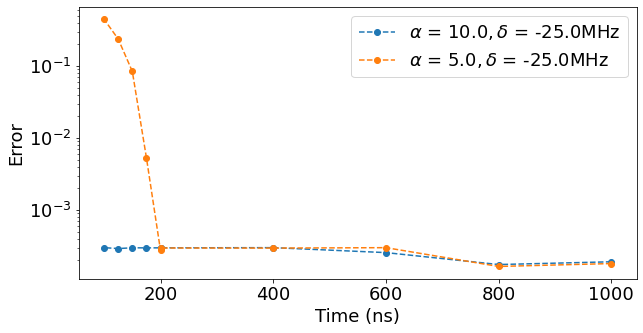

In [91]:
fig,ax = plt.subplots(1,1,figsize=(10,5))
ax.set_yscale('log')
for ii,t in enumerate(tll):
    label = '$\\alpha$ = '+str(paramval[ii]['alpha'])+ '$, \\delta$ = '+str(paramval[ii]['delta_c']*1e3)+"MHz"
    ax.plot(t,array(errorll[ii]),'o--',label = label )
ax.set_xlabel('Time (ns)')
ax.set_ylabel('Error')
ax.legend()

# After adding Kerr term

C:\_Lib\python\qoc\helper_functions\data_management.py:13: H5pyDeprecationWarning: The default file mode will change to 'r' (read-only) in h5py 3.0. To suppress this warning, pass the mode you need to h5py.File(), or set the global default h5.get_config().default_file_mode, or set the environment variable H5PY_DEFAULT_READONLY=1. Available modes are: 'r', 'r+', 'w', 'w-'/'x', 'a'. See the docs for details.
  h5py.File.__init__(self, *args, **kwargs)


data saved at: D:/_slab/IPython Notebooks/Optimal Control/oct_data/circle_grape_pulses\00013_g0_to_g1_circlgrape.h5


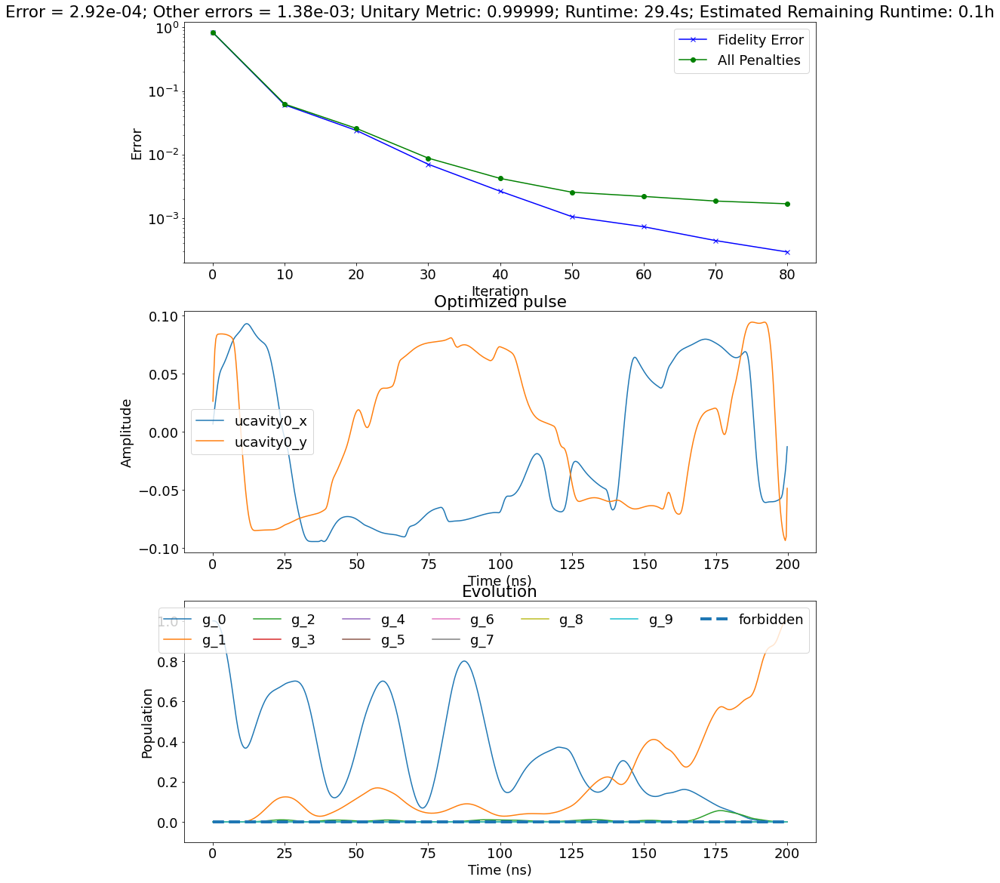

In [115]:
mode = 3
mode_levels = 10
chi,kappa = chis[mode]*1e-3,kappas[mode]*1e-6
circle_grape_params = {"chis":[chi],"kappas":[kappa],"alpha":10.0,"delta_c":-0.025}
add_disp_kerr = True
op = multimode_circle_grape_optimal_control(mode_state_num = mode_levels,number_of_modes = 1,hparams = circle_grape_params,add_disp_kerr=add_disp_kerr)


states_forbidden_list = []
total_time = 200.0
steps  = 600

convergence = {'rate': 0.1, 'update_step': 10, 'max_iterations': 1000,
               'conv_target': 3e-4, 'learning_rate_decay': 500.0}


reg_coeffs = {'dwdt': 0.1, 'd2wdt2': 1.0e-3, 'forbid_dressed': False,
              'states_forbidden_list':states_forbidden_list,
              'forbidden_coeff_list': [1.0*steps] * len(states_forbidden_list)}



initial_guess = None
# initial_guess = np.ones((2, int(steps))) * 2*np.pi * 10.0e-6/np.sqrt(2)
# initial_guess = np.random.normal(loc=0.0, scale=2*np.pi*15e-7, size=(len(Hops), int(steps)))


expt_name = 'g0_to_g1_circlgrape'
file_number = 6
initial_pulse = "D:/_slab/IPython Notebooks/Optimal Control/oct_data/circle_grape_pulses/" + \
                str(file_number).zfill(5) + "_" + expt_name.lower()+".h5"

with h5py.File(initial_pulse,'r') as hf:
    last_u0 = np.array(hf['uks'])[-1]
initial_guess = last_u0


op.run_optimal_control(state_transfer = True, initial_states = [0], target_states = [1], 
                        total_time = total_time, steps = steps,max_amp = 15e-3, 
                        taylor_terms = None,is_dressed=False, 
                        convergence = convergence, reg_coeffs =  reg_coeffs,
                        plot_only_g = True,
                        states_forbidden_list = states_forbidden_list,initial_guess = initial_guess, 
                        file_name="g0_to_g1_circlgrape", data_path=data_path)

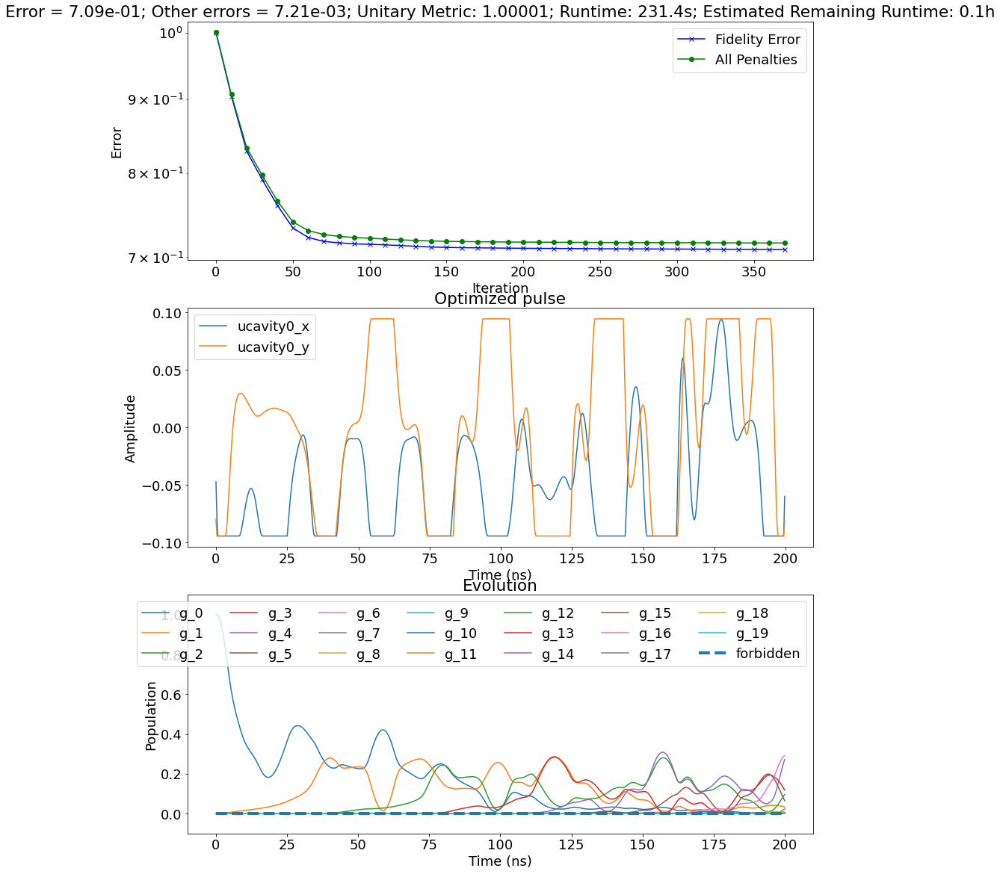

In [122]:
mode = 3
mode_levels = 20
chi,kappa = chis[mode]*1e-3,kappas[mode]*1e-6
circle_grape_params = {"chis":[chi],"kappas":[kappa],"alpha":10.0,"delta_c":-0.025}
add_disp_kerr = False
op = multimode_circle_grape_optimal_control(mode_state_num = mode_levels,number_of_modes = 1,hparams = circle_grape_params,add_disp_kerr=add_disp_kerr)


states_forbidden_list = []
total_time = 200.0
steps  = 600

convergence = {'rate': 0.1, 'update_step': 10, 'max_iterations': 1000,
               'conv_target': 3e-4, 'learning_rate_decay': 500.0}


reg_coeffs = {'dwdt': 0.1, 'd2wdt2': 1.0e-3, 'forbid_dressed': False,
              'states_forbidden_list':states_forbidden_list,
              'forbidden_coeff_list': [1.0*steps] * len(states_forbidden_list)}



initial_guess = None
# initial_guess = np.ones((2, int(steps))) * 2*np.pi * 10.0e-6/np.sqrt(2)
# initial_guess = np.random.normal(loc=0.0, scale=2*np.pi*15e-7, size=(len(Hops), int(steps)))


expt_name = 'g0_to_g1_circlgrape'
file_number = 6
initial_pulse = "D:/_slab/IPython Notebooks/Optimal Control/oct_data/circle_grape_pulses/" + \
                str(file_number).zfill(5) + "_" + expt_name.lower()+".h5"

with h5py.File(initial_pulse,'r') as hf:
    last_u0 = np.array(hf['uks'])[-1]
initial_guess = last_u0


op.run_optimal_control(state_transfer = True, initial_states = [0], target_states = [6], 
                        total_time = total_time, steps = steps,max_amp = 15e-3, 
                        taylor_terms = None,is_dressed=False, 
                        convergence = convergence, reg_coeffs =  reg_coeffs,
                        plot_only_g = True,
                        states_forbidden_list = states_forbidden_list,initial_guess = initial_guess, 
                        file_name="g0_to_g6_circlgrape", data_path=data_path)

C:\_Lib\python\qoc\helper_functions\data_management.py:13: H5pyDeprecationWarning: The default file mode will change to 'r' (read-only) in h5py 3.0. To suppress this warning, pass the mode you need to h5py.File(), or set the global default h5.get_config().default_file_mode, or set the environment variable H5PY_DEFAULT_READONLY=1. Available modes are: 'r', 'r+', 'w', 'w-'/'x', 'a'. See the docs for details.
  h5py.File.__init__(self, *args, **kwargs)


data saved at: D:/_slab/IPython Notebooks/Optimal Control/oct_data/circle_grape_pulses\00001_g0_to_g6_circlgrape.h5


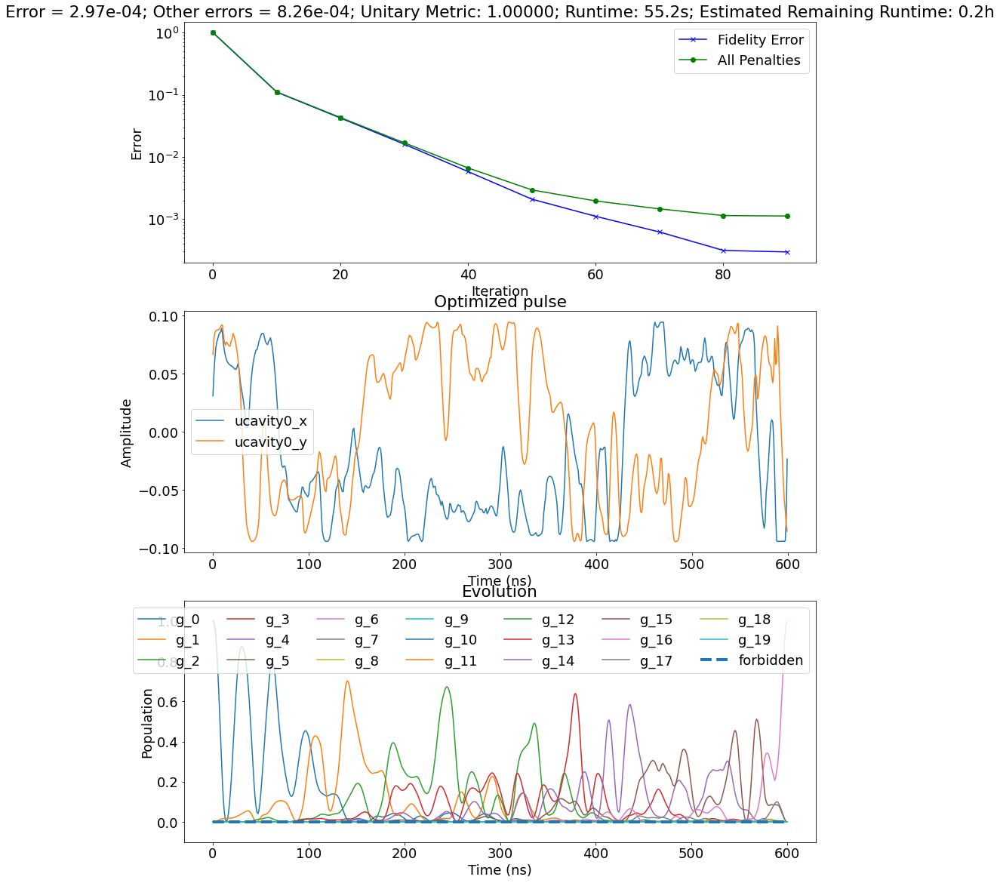

In [124]:
mode = 3
mode_levels = 20
chi,kappa = chis[mode]*1e-3,kappas[mode]*1e-6
circle_grape_params = {"chis":[chi],"kappas":[kappa],"alpha":10.0,"delta_c":-0.025}
add_disp_kerr = False
op = multimode_circle_grape_optimal_control(mode_state_num = mode_levels,number_of_modes = 1,hparams = circle_grape_params,add_disp_kerr=add_disp_kerr)


states_forbidden_list = []
total_time = 600.0
steps  = 600

convergence = {'rate': 0.1, 'update_step': 10, 'max_iterations': 1000,
               'conv_target': 3e-4, 'learning_rate_decay': 500.0}


reg_coeffs = {'dwdt': 0.1, 'd2wdt2': 1.0e-3, 'forbid_dressed': False,
              'states_forbidden_list':states_forbidden_list,
              'forbidden_coeff_list': [1.0*steps] * len(states_forbidden_list)}



initial_guess = None
# initial_guess = np.ones((2, int(steps))) * 2*np.pi * 10.0e-6/np.sqrt(2)
# initial_guess = np.random.normal(loc=0.0, scale=2*np.pi*15e-7, size=(len(Hops), int(steps)))


expt_name = 'g0_to_g1_circlgrape'
file_number = 6
initial_pulse = "D:/_slab/IPython Notebooks/Optimal Control/oct_data/circle_grape_pulses/" + \
                str(file_number).zfill(5) + "_" + expt_name.lower()+".h5"

with h5py.File(initial_pulse,'r') as hf:
    last_u0 = np.array(hf['uks'])[-1]
initial_guess = last_u0


op.run_optimal_control(state_transfer = True, initial_states = [0], target_states = [6], 
                        total_time = total_time, steps = steps,max_amp = 15e-3, 
                        taylor_terms = None,is_dressed=False, 
                        convergence = convergence, reg_coeffs =  reg_coeffs,
                        plot_only_g = True,
                        states_forbidden_list = states_forbidden_list,initial_guess = initial_guess, 
                        file_name="g0_to_g6_circlgrape", data_path=data_path)

C:\_Lib\python\qoc\helper_functions\data_management.py:13: H5pyDeprecationWarning: The default file mode will change to 'r' (read-only) in h5py 3.0. To suppress this warning, pass the mode you need to h5py.File(), or set the global default h5.get_config().default_file_mode, or set the environment variable H5PY_DEFAULT_READONLY=1. Available modes are: 'r', 'r+', 'w', 'w-'/'x', 'a'. See the docs for details.
  h5py.File.__init__(self, *args, **kwargs)


data saved at: D:/_slab/IPython Notebooks/Optimal Control/oct_data/circle_grape_pulses\00002_g0_to_g6_circlgrape.h5


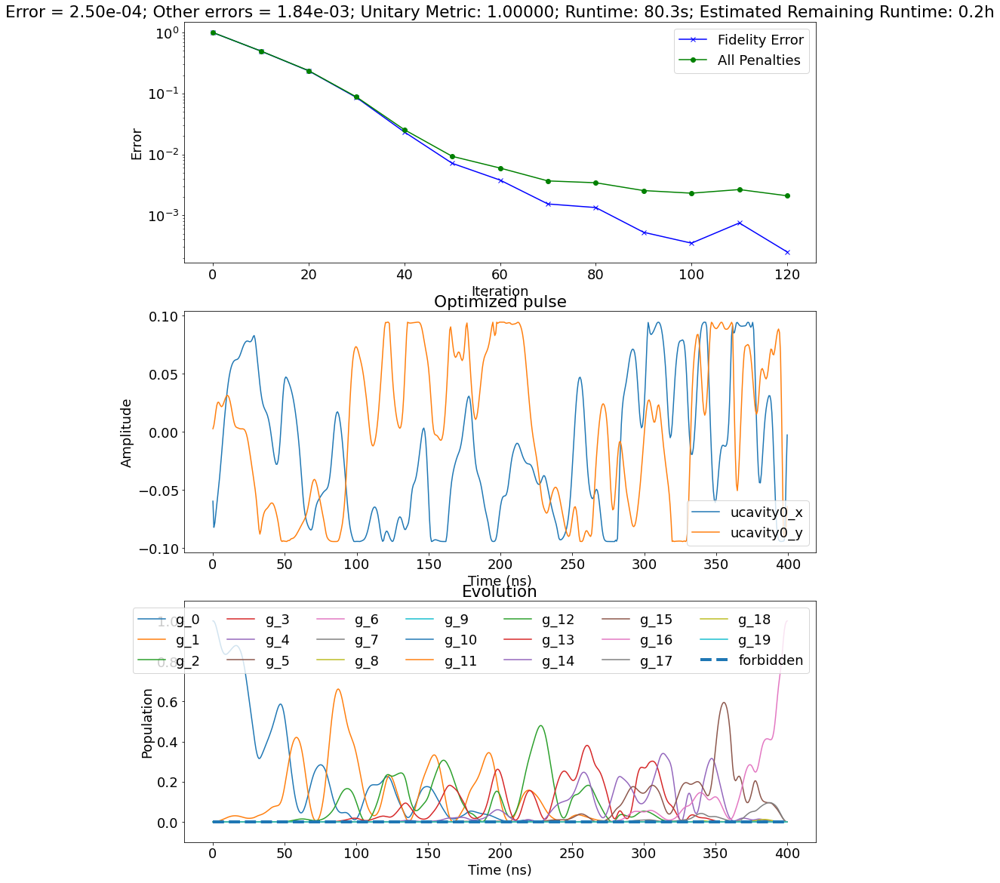

In [125]:
mode = 3
mode_levels = 20
chi,kappa = chis[mode]*1e-3,kappas[mode]*1e-6
circle_grape_params = {"chis":[chi],"kappas":[kappa],"alpha":10.0,"delta_c":-0.025}
add_disp_kerr = False
op = multimode_circle_grape_optimal_control(mode_state_num = mode_levels,number_of_modes = 1,hparams = circle_grape_params,add_disp_kerr=add_disp_kerr)


states_forbidden_list = []
total_time = 400.0
steps  = 600

convergence = {'rate': 0.1, 'update_step': 10, 'max_iterations': 1000,
               'conv_target': 3e-4, 'learning_rate_decay': 500.0}


reg_coeffs = {'dwdt': 0.1, 'd2wdt2': 1.0e-3, 'forbid_dressed': False,
              'states_forbidden_list':states_forbidden_list,
              'forbidden_coeff_list': [1.0*steps] * len(states_forbidden_list)}



initial_guess = None
# initial_guess = np.ones((2, int(steps))) * 2*np.pi * 10.0e-6/np.sqrt(2)
# initial_guess = np.random.normal(loc=0.0, scale=2*np.pi*15e-7, size=(len(Hops), int(steps)))


expt_name = 'g0_to_g1_circlgrape'
file_number = 6
initial_pulse = "D:/_slab/IPython Notebooks/Optimal Control/oct_data/circle_grape_pulses/" + \
                str(file_number).zfill(5) + "_" + expt_name.lower()+".h5"

with h5py.File(initial_pulse,'r') as hf:
    last_u0 = np.array(hf['uks'])[-1]
initial_guess = last_u0


op.run_optimal_control(state_transfer = True, initial_states = [0], target_states = [6], 
                        total_time = total_time, steps = steps,max_amp = 15e-3, 
                        taylor_terms = None,is_dressed=False, 
                        convergence = convergence, reg_coeffs =  reg_coeffs,
                        plot_only_g = True,
                        states_forbidden_list = states_forbidden_list,initial_guess = initial_guess, 
                        file_name="g0_to_g6_circlgrape", data_path=data_path)

C:\_Lib\python\qoc\helper_functions\data_management.py:13: H5pyDeprecationWarning: The default file mode will change to 'r' (read-only) in h5py 3.0. To suppress this warning, pass the mode you need to h5py.File(), or set the global default h5.get_config().default_file_mode, or set the environment variable H5PY_DEFAULT_READONLY=1. Available modes are: 'r', 'r+', 'w', 'w-'/'x', 'a'. See the docs for details.
  h5py.File.__init__(self, *args, **kwargs)


data saved at: D:/_slab/IPython Notebooks/Optimal Control/oct_data/circle_grape_pulses\00003_g0_to_g6_circlgrape.h5


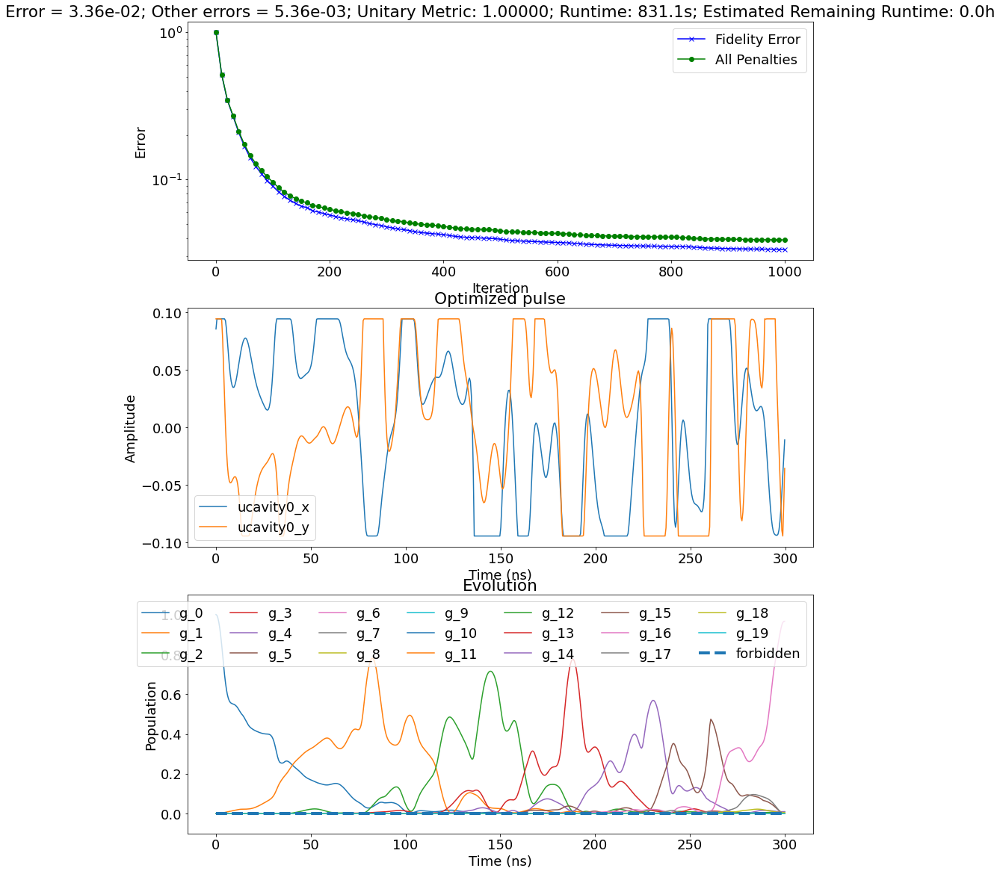

In [126]:
mode = 3
mode_levels = 20
chi,kappa = chis[mode]*1e-3,kappas[mode]*1e-6
circle_grape_params = {"chis":[chi],"kappas":[kappa],"alpha":10.0,"delta_c":-0.025}
add_disp_kerr = False
op = multimode_circle_grape_optimal_control(mode_state_num = mode_levels,number_of_modes = 1,hparams = circle_grape_params,add_disp_kerr=add_disp_kerr)


states_forbidden_list = []
total_time = 300.0
steps  = 600

convergence = {'rate': 0.1, 'update_step': 10, 'max_iterations': 1000,
               'conv_target': 3e-4, 'learning_rate_decay': 500.0}


reg_coeffs = {'dwdt': 0.1, 'd2wdt2': 1.0e-3, 'forbid_dressed': False,
              'states_forbidden_list':states_forbidden_list,
              'forbidden_coeff_list': [1.0*steps] * len(states_forbidden_list)}



initial_guess = None
# initial_guess = np.ones((2, int(steps))) * 2*np.pi * 10.0e-6/np.sqrt(2)
# initial_guess = np.random.normal(loc=0.0, scale=2*np.pi*15e-7, size=(len(Hops), int(steps)))


expt_name = 'g0_to_g1_circlgrape'
file_number = 6
initial_pulse = "D:/_slab/IPython Notebooks/Optimal Control/oct_data/circle_grape_pulses/" + \
                str(file_number).zfill(5) + "_" + expt_name.lower()+".h5"

with h5py.File(initial_pulse,'r') as hf:
    last_u0 = np.array(hf['uks'])[-1]
initial_guess = last_u0


op.run_optimal_control(state_transfer = True, initial_states = [0], target_states = [6], 
                        total_time = total_time, steps = steps,max_amp = 15e-3, 
                        taylor_terms = None,is_dressed=False, 
                        convergence = convergence, reg_coeffs =  reg_coeffs,
                        plot_only_g = True,
                        states_forbidden_list = states_forbidden_list,initial_guess = initial_guess, 
                        file_name="g0_to_g6_circlgrape", data_path=data_path)

In [127]:
tlist = flip(append(linspace(100,300,7),linspace(300,1000,5)))

C:\_Lib\python\qoc\helper_functions\data_management.py:13: H5pyDeprecationWarning: The default file mode will change to 'r' (read-only) in h5py 3.0. To suppress this warning, pass the mode you need to h5py.File(), or set the global default h5.get_config().default_file_mode, or set the environment variable H5PY_DEFAULT_READONLY=1. Available modes are: 'r', 'r+', 'w', 'w-'/'x', 'a'. See the docs for details.
  h5py.File.__init__(self, *args, **kwargs)


data saved at: D:/_slab/IPython Notebooks/Optimal Control/oct_data/circle_grape_pulses\00011_g0_to_g6_circlgrape_alpha_10.h5


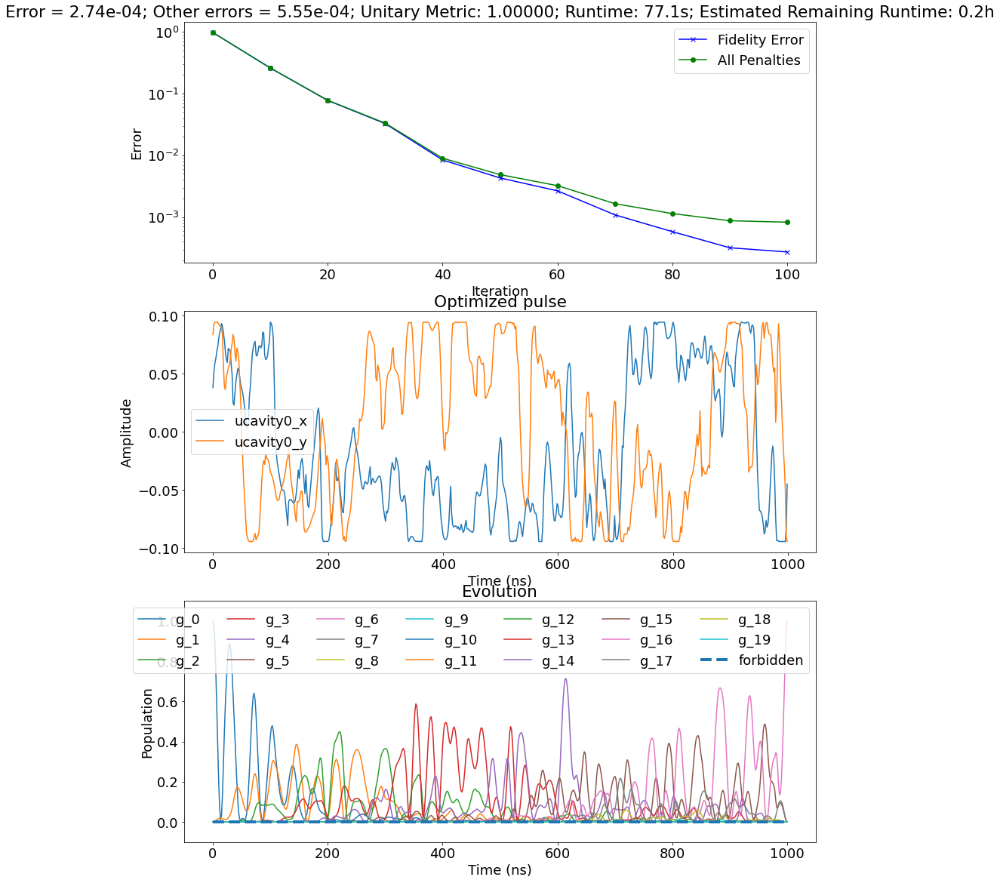

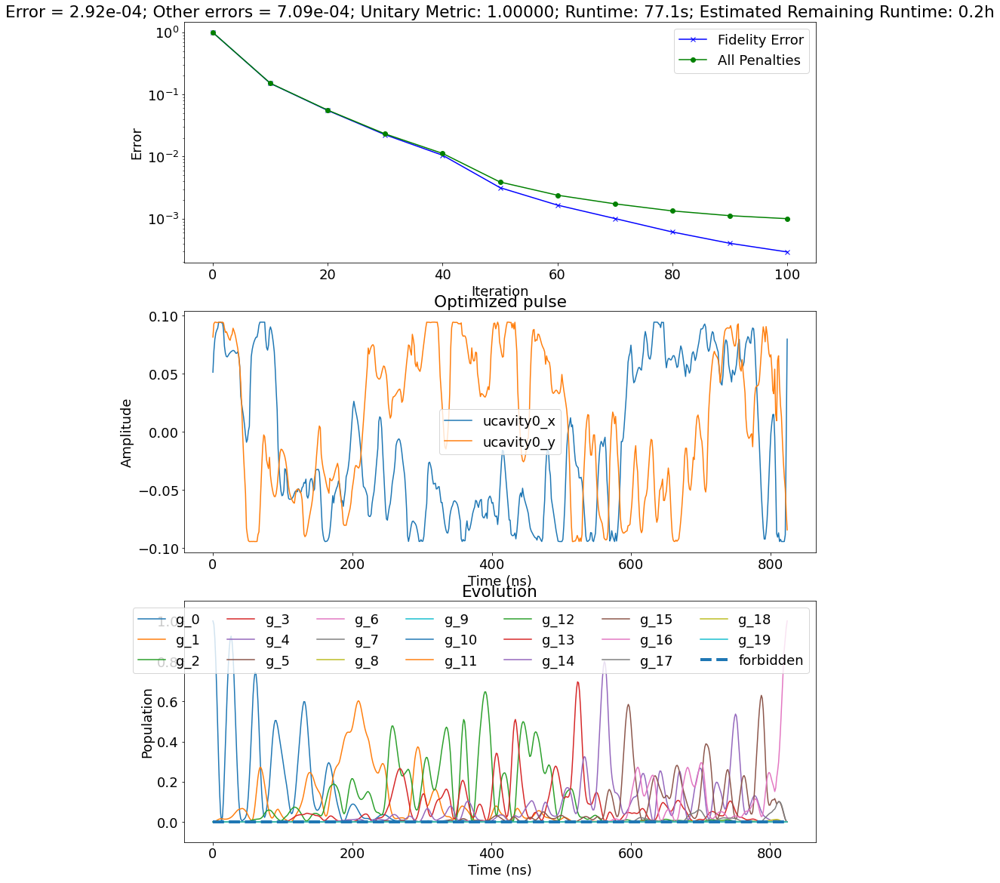

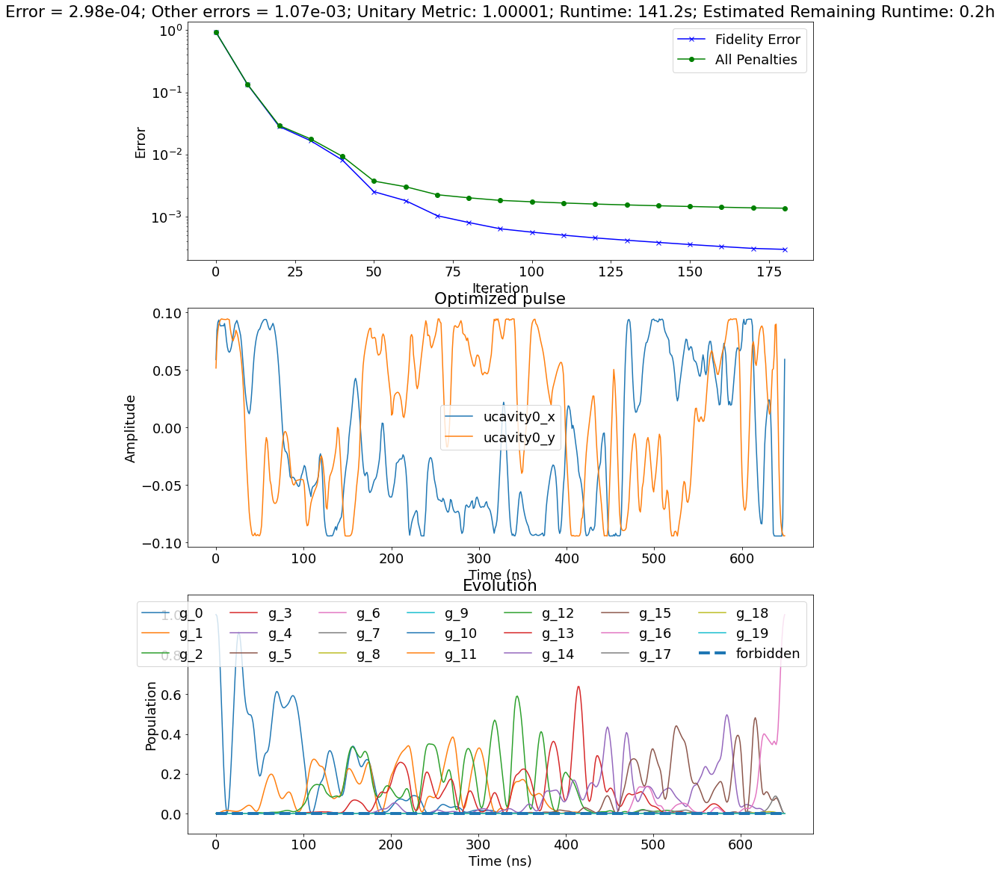

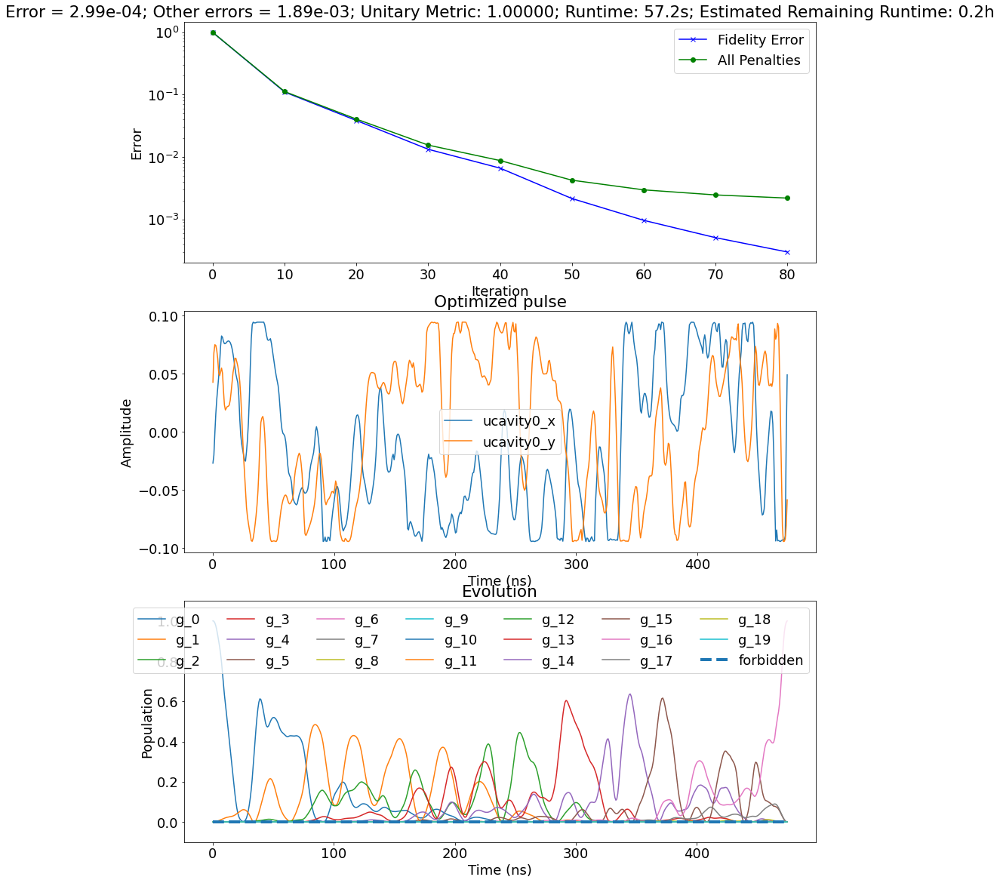

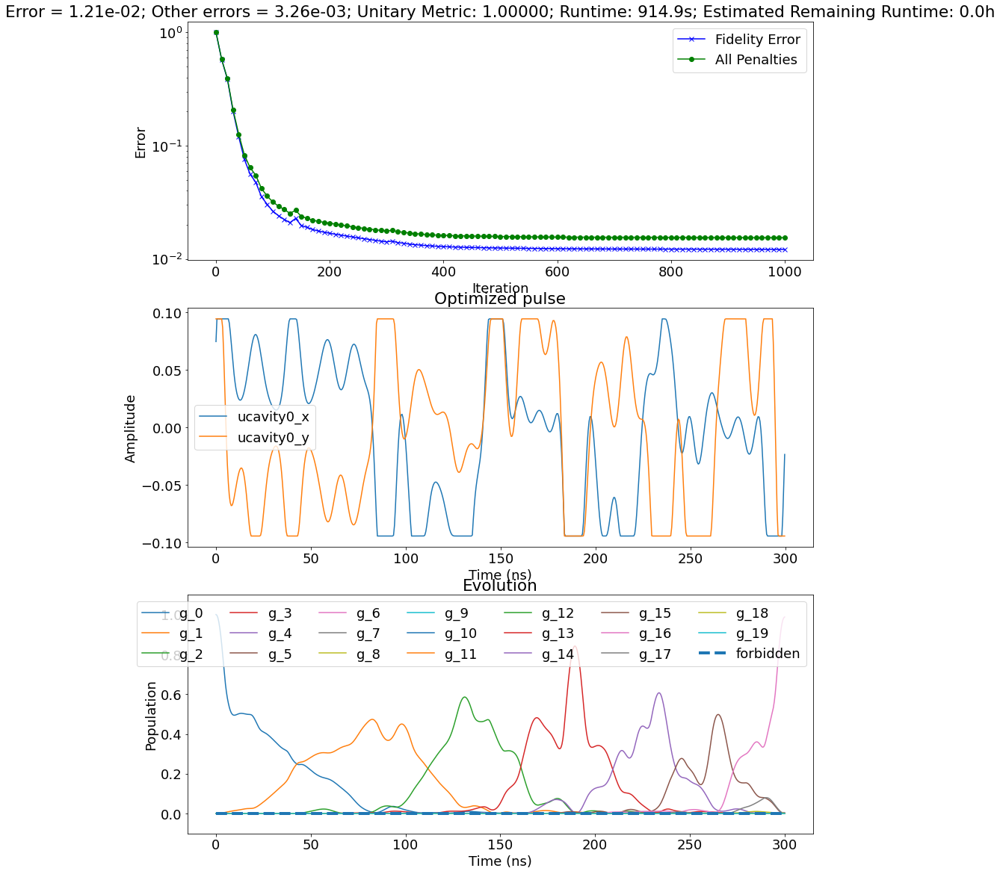

...

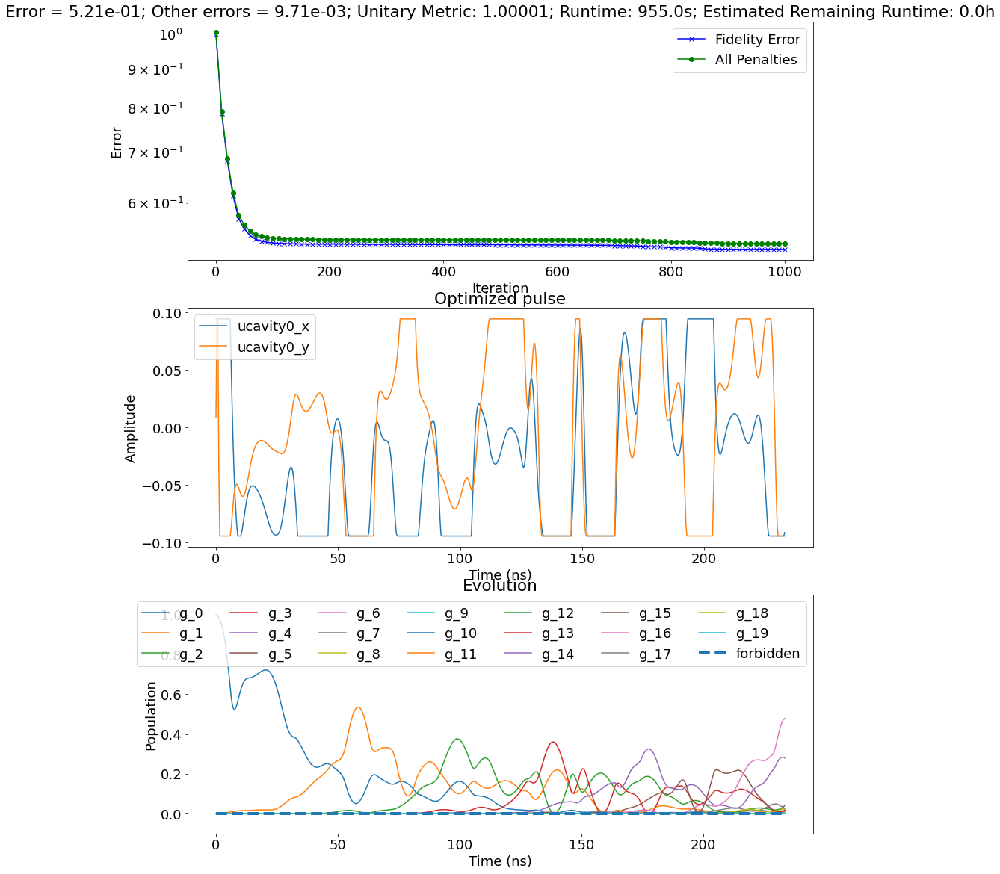

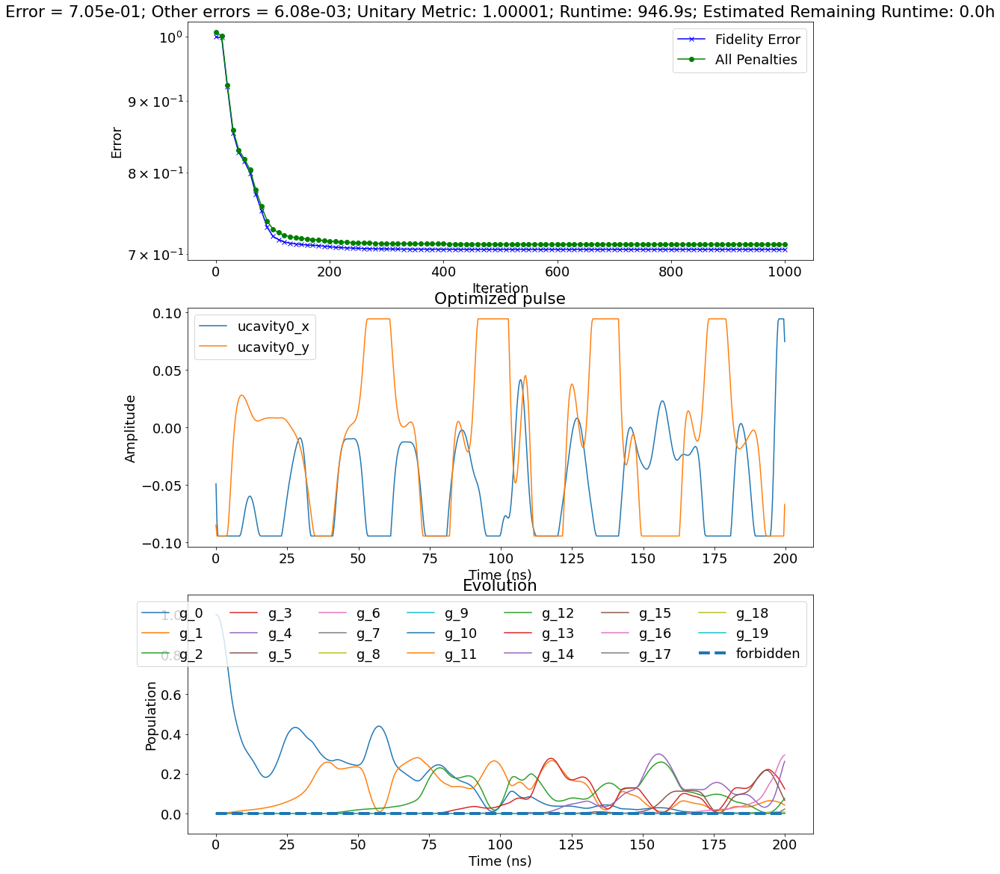

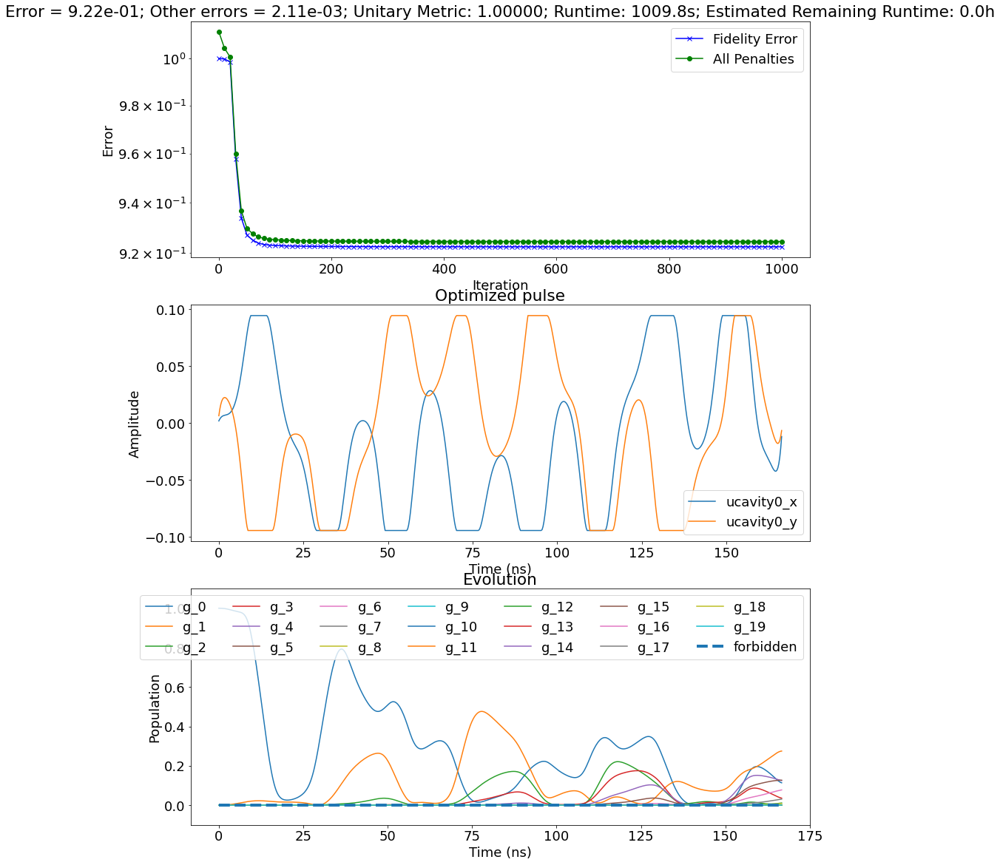

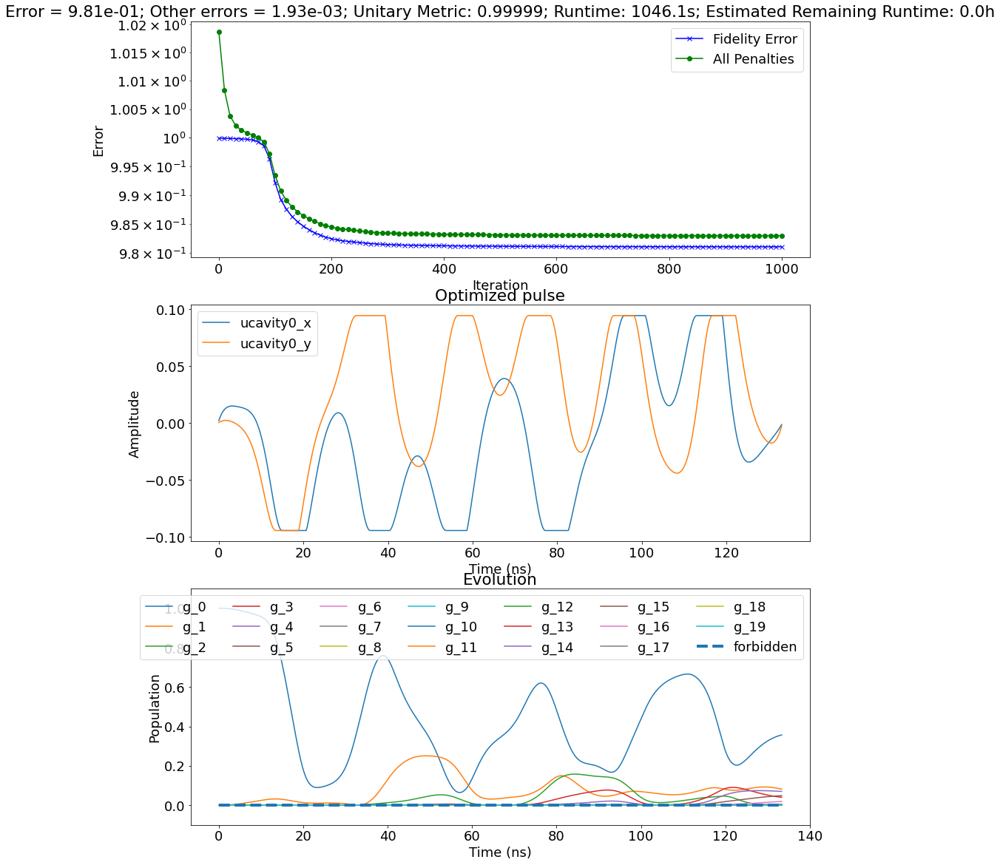

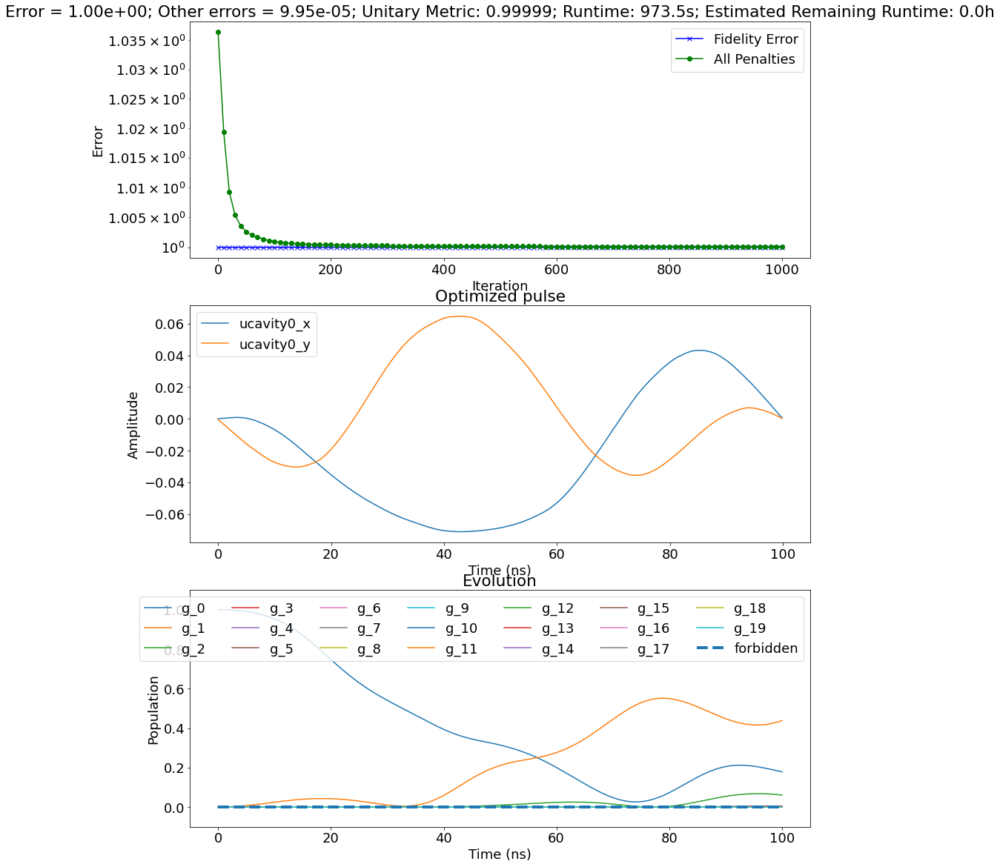

In [131]:
mode = 3
mode_levels = 20
chi,kappa = chis[mode]*1e-3,kappas[mode]*1e-6
circle_grape_params = {"chis":[chi],"kappas":[kappa],"alpha":10.0,"delta_c":-0.025}

for ii,time in enumerate(tlist):

    op = multimode_circle_grape_optimal_control(mode_state_num = mode_levels,number_of_modes = 1,hparams = circle_grape_params,add_disp_kerr=False)


    states_forbidden_list = []
    total_time = time
    print (time)
    steps  = 600

    convergence = {'rate': 0.1, 'update_step': 10, 'max_iterations': 1000,
                   'conv_target': 3e-4, 'learning_rate_decay': 500.0}


    reg_coeffs = {'dwdt': 0.1, 'd2wdt2': 1.0e-3, 'forbid_dressed': False,
                  'states_forbidden_list':states_forbidden_list,
                  'forbidden_coeff_list': [1.0*steps] * len(states_forbidden_list)}


    expt_name = 'g0_to_g6_circlgrape'
    file_number = 1
    initial_pulse = "D:/_slab/IPython Notebooks/Optimal Control/oct_data/circle_grape_pulses/" + \
                    str(file_number).zfill(5) + "_" + expt_name.lower()+".h5"

    with h5py.File(initial_pulse,'r') as hf:
        last_u0 = np.array(hf['uks'])[-1]
    initial_guess = last_u0



    op.run_optimal_control(state_transfer = True, initial_states = [0], target_states = [6], 
                            total_time = total_time, steps = steps,max_amp = 15e-3, 
                            taylor_terms = None,is_dressed=False, 
                            convergence = convergence, reg_coeffs =  reg_coeffs,
                            plot_only_g = True,
                            states_forbidden_list = states_forbidden_list,initial_guess = initial_guess, 
                            file_name="g0_to_g6_circlgrape_alpha_10", data_path=data_path)

In [134]:
errorlist = []

for ii in range(len(tlist)):
    expt_name = 'g0_to_g6_circlgrape_alpha_10'
    file_number = ii
    fn = "D:/_slab/IPython Notebooks/Optimal Control/oct_data/circle_grape_pulses/" + \
                    str(file_number).zfill(5) + "_" + expt_name.lower()+".h5"

    with h5py.File(fn,'r') as hf:
        print ("Error = ",np.array(hf['error'])[-1])
        errorlist.append(np.array(hf['error'])[-1])

Error =  0.00027364492
Error =  0.00029170513
Error =  0.00029790401
Error =  0.00029921532
Error =  0.012148619
Error =  0.012148619
Error =  0.19827104
Error =  0.52138394
Error =  0.7054318
Error =  0.9223549
Error =  0.9810809
Error =  0.99999994


In [143]:
errorll = errorll[:2]
tll = tll[:2]
paramval = paramval[:2]

In [144]:
errorll.append(errorlist)
tll.append(tlist)
paramval.append(circle_grape_params)

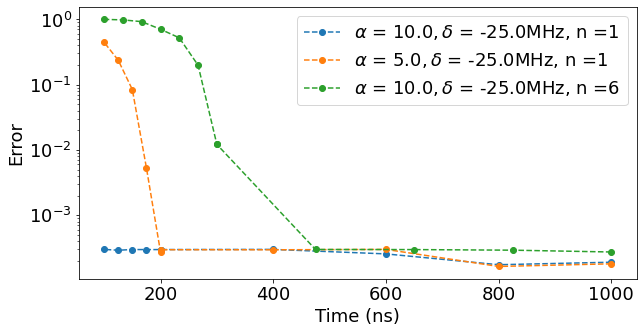

In [147]:
fig,ax = plt.subplots(1,1,figsize=(10,5))
ax.set_yscale('log')
ns = [1,1,6]
for ii,t in enumerate(tll):
    label = '$\\alpha$ = '+str(paramval[ii]['alpha'])+ '$, \\delta$ = '+str(paramval[ii]['delta_c']*1e3)+"MHz" + ", n ="+str(ns[ii])
    ax.plot(t,array(errorll[ii]),'o--',label = label )
ax.set_xlabel('Time (ns)')
ax.set_ylabel('Error')
ax.legend()